<a href="https://colab.research.google.com/github/christophergaughan/Bioinformatics-Code/blob/main/Another_copy_of_Case_5a_refined_gene_assessment_dans_gene_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Roadmap for RNA-seq Analysis in Mouse Developmental Dataset

---

## Preliminary Steps:

1. **Data Loading**:
    - Import the pre-processed RNA-seq data, assuming no missing values and that it's already normalized.

2. **Exploratory Data Analysis (EDA)**:
    - Visualize the overall distribution of gene expressions across different time points (E8.5, E9.5, E10.5).
    - Identify patterns and outliers in the data.

---

## Addressing Hypotheses:

### Hypothesis 1:
- **Maturation Gene List Analysis**:
    - Filter genes within the maturation gene list.
    - Analyze correlation of these genes with ALB and AFP.
    - Identify genes most upregulated at E10.5 and also account for variances within E10.5 cells.

### Hypothesis 2:
- **Growth Gene List Analysis at Early Stages**:
    - Filter genes within the growth gene list.
    - Identify genes most highly expressed at E9.5 and compare expressions at E8.5 and E10.5.
    - Study correlation of these genes with TBX3.

### Hypothesis 3:
- **Noise Reduction in Data**:
    - Use dimensionality reduction techniques such as PCA or t-SNE.
    - Combine data for several genes or transcription factors into fewer quantitative metrics that represent maturity and growth stages.
    - Visualize reduced data for cell-to-cell comparisons.

### Hypothesis 4:
- **Transcription Factor Analysis for Maturation**:
    - Filter out the list of transcription factors provided.
    - Analyze correlation of these TFs with maturation genes.
    - Identify key TFs, keeping an eye on CEBPA and others.

### Hypothesis 5:
- **Transcription Factor Analysis for Growth**:
    - Study the expression values of TFs across time points E8.5, E9.5, and E10.5.
    - Identify TFs that show increased expression from E8.5 to E9.5 and decreased expression from E9.5 to E10.5.
    - Especially focus on TFs that might regulate the growth gene list, including TBX3.

---

## Advanced Analysis:

1. **Simple Machine Learning Models**:
    - Start with traditional machine learning models such as Random Forest or Gradient Boosted Trees to identify important features and establish a baseline performance.

2. **Neural Network Modelling**:
    - Use TensorFlow to build neural network models.
    - Capture non-linear characteristics in the data.
    - Compare performance with traditional models.

---

## Notes:
- Ensure compatibility with Google Colab resources.
- Regular checkpoints are advisable for lengthy computations.
- Engage in frequent communication with PI Natesh and graduate student Dan for any clarifications.


In [2]:
import pandas as pd

# Load the tab-delimited file
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/hepatic_counts_normalized_pt_2.txt', sep='\t')

# Display the first few rows of the data to ensure it's loaded correctly
data.head()

,Unnamed: 0,Xkr4,Gm1992,Gm37381,Rp1,Sox17,Gm37323,Mrpl15,Lypla1,Gm37988,...,AC125149.1,AC125149.2,AC125149.4,AC234645.1,AC168977.2,AC168977.1,AC149090.1,CAAA01118383.1,Vmn2r122,CAAA01147332.1
0,E75_1_AAATGCCGTCGAACAG-1,0.0,0.0,0.0,0.0,0.903261,0.0,1.204348,0.301087,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.301087,0.000000,0.0,0.0
1,E75_1_AACCATGTCTAACCGA-1,0.0,0.0,0.0,0.0,0.854628,0.0,1.424380,0.854628,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.284876,0.000000,0.0,0.0
2,E75_1_AACCGCGGTGTGCCTG-1,0.0,0.0,0.0,0.0,2.461639,0.0,1.230820,0.410273,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.410273,0.0,0.0
3,E75_1_AAGACCTAGTCCATAC-1,0.0,0.0,0.0,0.0,0.277223,0.0,1.386117,0.831670,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
4,E75_1_ACACCCTGTTGTTTGG-1,0.0,0.0,0.0,0.0,0.000000,0.0,0.779727,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0


In [3]:
# Rename the column
data.rename(columns={'Unnamed: 0': 'cell_state'}, inplace=True)

# Display the first few rows to confirm the change
data.head(20)

,cell_state,Xkr4,Gm1992,Gm37381,Rp1,Sox17,Gm37323,Mrpl15,Lypla1,Gm37988,...,AC125149.1,AC125149.2,AC125149.4,AC234645.1,AC168977.2,AC168977.1,AC149090.1,CAAA01118383.1,Vmn2r122,CAAA01147332.1
0,E75_1_AAATGCCGTCGAACAG-1,0.0,0.0,0.0,0.0,0.903261,0.0,1.204348,0.301087,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.301087,0.000000,0.0,0.0
1,E75_1_AACCATGTCTAACCGA-1,0.0,0.0,0.0,0.0,0.854628,0.0,1.424380,0.854628,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.284876,0.000000,0.0,0.0
2,E75_1_AACCGCGGTGTGCCTG-1,0.0,0.0,0.0,0.0,2.461639,0.0,1.230820,0.410273,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.410273,0.0,0.0
3,E75_1_AAGACCTAGTCCATAC-1,0.0,0.0,0.0,0.0,0.277223,0.0,1.386117,0.831670,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
4,E75_1_ACACCCTGTTGTTTGG-1,0.0,0.0,0.0,0.0,0.000000,0.0,0.779727,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
5,E75_1_ACAGCTAAGACACGAC-1,0.0,0.0,0.0,0.0,0.330360,0.0,0.660720,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.660720,0.000000,0.0,0.0
6,E75_1_ACAGCTAGTGTGAAAT-1,0.0,0.0,0.0,0.0,0.000000,0.0,0.692809,0.346404,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.692809,0.0,0.0
7,E75_1_ACGAGCCCAGTCGATT-1,0.0,0.0,0.0,0.0,0.339859,0.0,0.679717,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.339859,0.339859,0.0,0.0
8,E75_1_ACGTCAAGTCGAACAG-1,0.0,0.0,0.0,0.0,0.283062,0.0,0.000000,0.849185,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.283062,0.283062,0.0,0.0
9,E75_1_AGGCCACCAAGGTGTG-1,0.0,0.0,0.0,0.0,1.247754,0.0,0.748652,0.748652,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.249551,0.000000,0.0,0.0


# RNA-seq Analysis Roadmap on Mouse Developmental Dataset

---

## Preliminary Steps:

1. **Exploratory Data Analysis (EDA)**:
    - Visualize the distribution of `cell_state` to understand the sample distribution across different time points.

---

## Addressing Hypotheses:

### Hypothesis 1:
- **Maturation Gene List Analysis**:
    - Filter for genes within the maturation gene list.
    - Analyze correlation of these genes with ALB and AFP.
    - For time point E10.5 (`cell_state` starting with E105), identify genes that are most upregulated.

### Hypothesis 2:
- **Growth Gene List Analysis at Early Stages**:
    - Filter for genes within the growth gene list.
    - Compare gene expression levels across E8.5 (E85), E9.5 (E95), and E10.5 (E105) time points.
    - Examine the correlation of these genes with TBX3.

### Hypothesis 3:
- **Noise Reduction in Data**:
    - Employ dimensionality reduction techniques such as PCA or t-SNE.
    - Aggregate data of several genes or transcription factors into fewer metrics that represent maturity and growth stages.
    - Visualize reduced data to enable cell-to-cell comparisons.

### Hypothesis 4:
- **Transcription Factor Analysis for Maturation**:
    - Filter the list of transcription factors provided.
    - Examine correlation between these TFs and maturation genes.
    - Highlight key transcription factors, with emphasis on CEBPA.

### Hypothesis 5:
- **Transcription Factor Analysis for Growth**:
    - Analyze the expression profiles of transcription factors across time points E8.5 (E85), E9.5 (E95), and E10.5 (E105).
    - Identify TFs that have rising expression from E8.5 to E9.5 and a decrease from E9.5 to E10.5.
    - Focus on TFs believed to regulate the growth gene list, including TBX3.

---

## Advanced Analysis:

1. **Simple Machine Learning Models**:
    - Utilize traditional machine learning models, such as Random Forest or Gradient Boosted Trees, to determine key features and establish a performance baseline.

2. **Neural Network Modeling**:
    - Develop neural network models with TensorFlow.
    - Extract non-linear patterns in the dataset.
    - Contrast the neural network performance with the earlier models.

---

## Execution Tips:
- For segregating data based on time points, we will use Python's string operations:
    ```python
    e85_data = data[data['cell_state'].str.startswith('E85')]
    e95_data = data[data['cell_state'].str.startswith('E95')]
    e105_data = data[data['cell_state'].str.startswith('E105')]
    ```
- we will constantly visualize data at every step. Visualization provides intuition which can guide subsequent analysis.
- we will ensure compatibility with Google Colab resources. For heavy computations, consider using Colab Pro for extended RAM and faster GPUs.
- we will regularly save progress and create checkpoints, especially before running intensive operations.
- we will keep open communication with PI Natesh and graduate student Dan, to ensure alignment and clarify any ambiguities.


In [4]:
# Extract time point from cell_state and store in a new column
data['time_point'] = data['cell_state'].str.extract(r'(^E\d{2,3})')

# Display the first few rows to confirm the changes
data.head()


,cell_state,Xkr4,Gm1992,Gm37381,Rp1,Sox17,Gm37323,Mrpl15,Lypla1,Gm37988,...,AC125149.2,AC125149.4,AC234645.1,AC168977.2,AC168977.1,AC149090.1,CAAA01118383.1,Vmn2r122,CAAA01147332.1,time_point
0,E75_1_AAATGCCGTCGAACAG-1,0.0,0.0,0.0,0.0,0.903261,0.0,1.204348,0.301087,0.0,...,0.0,0.0,0.0,0.0,0.0,0.301087,0.000000,0.0,0.0,E75
1,E75_1_AACCATGTCTAACCGA-1,0.0,0.0,0.0,0.0,0.854628,0.0,1.424380,0.854628,0.0,...,0.0,0.0,0.0,0.0,0.0,0.284876,0.000000,0.0,0.0,E75
2,E75_1_AACCGCGGTGTGCCTG-1,0.0,0.0,0.0,0.0,2.461639,0.0,1.230820,0.410273,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.410273,0.0,0.0,E75
3,E75_1_AAGACCTAGTCCATAC-1,0.0,0.0,0.0,0.0,0.277223,0.0,1.386117,0.831670,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,E75
4,E75_1_ACACCCTGTTGTTTGG-1,0.0,0.0,0.0,0.0,0.000000,0.0,0.779727,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,E75


In [5]:
data_cleaned = data.drop(columns="cell_state")
total_nan = data_cleaned.isnull().sum().sum()
print(f"Total number of NaN values in the dataset: {total_nan}")


Total number of NaN values in the dataset: 0


In [6]:
total_empty_strings = (data_cleaned.applymap(lambda x: x == "")).sum().sum()
print(f"Total number of empty strings in the dataset: {total_empty_strings}")


Total number of empty strings in the dataset: 0


In [7]:
non_numeric = data_cleaned.applymap(lambda x: not isinstance(x, (int, float))).sum().sum()
print(f"Total number of non-numeric values in the dataset: {non_numeric}")


Total number of non-numeric values in the dataset: 2332


In [8]:
data_cleaned.head()

,Xkr4,Gm1992,Gm37381,Rp1,Sox17,Gm37323,Mrpl15,Lypla1,Gm37988,Tcea1,...,AC125149.2,AC125149.4,AC234645.1,AC168977.2,AC168977.1,AC149090.1,CAAA01118383.1,Vmn2r122,CAAA01147332.1,time_point
0,0.0,0.0,0.0,0.0,0.903261,0.0,1.204348,0.301087,0.0,0.602174,...,0.0,0.0,0.0,0.0,0.0,0.301087,0.000000,0.0,0.0,E75
1,0.0,0.0,0.0,0.0,0.854628,0.0,1.424380,0.854628,0.0,1.424380,...,0.0,0.0,0.0,0.0,0.0,0.284876,0.000000,0.0,0.0,E75
2,0.0,0.0,0.0,0.0,2.461639,0.0,1.230820,0.410273,0.0,1.641093,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.410273,0.0,0.0,E75
3,0.0,0.0,0.0,0.0,0.277223,0.0,1.386117,0.831670,0.0,1.386117,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,E75
4,0.0,0.0,0.0,0.0,0.000000,0.0,0.779727,0.000000,0.0,0.779727,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,E75


In [9]:
non_numeric_cols = data_cleaned.columns[data_cleaned.applymap(lambda x: not isinstance(x, (int, float))).any()].tolist()

for col in non_numeric_cols:
    print(f"Column '{col}' has non-numeric values:", data_cleaned[col][data_cleaned[col].apply(lambda x: not isinstance(x, (int, float)))].unique())


Column 'time_point' has non-numeric values: ['E75' 'E85' 'E95' 'E105']


In [10]:
dan_maturation_genes = [
    'Col18a1', 'Dsp', 'Ptprf', 'Gpc6', 'Wnk3', 'Cdh1', 'Epb41l5', 'Hook1', 'Myo1b', 'Rnf165',
    'Nav2', 'Crb3', 'Enpp1', 'Igsf9', 'Gata4', 'Lpin2', 'Arg1', 'Igfbp2', 'Tshz2', 'Tmprss2',
    'Lad1', 'Gata6', 'Nhsl1', 'Fgfr2', 'Smo', 'Rcan1', 'Efna2', 'Palm3', 'Cers4', 'Sorbs2',
    'Apoa2', 'Serpinf2', 'Apom', 'Ambp', 'Serpina6', 'Apoe', 'Phgdh', 'Rbp4', 'Serpinf1', 'Galk1',
    'Glud1', 'Serpind1', 'F2', 'Tst', 'Serpinc1', 'Apoa1', 'Apoc1', 'Qprt', 'Acaa2', 'Stard10',
    'F10', 'Pla2g12b', 'Fkbp11', 'Pcbd1', 'Nipsnap1', 'Gcat', 'Grhpr', 'Scp2', 'Vtn', 'Tmem37'
]

dan_growth_genes = [
    'Phb2', 'Cited1', 'Afp', 'Ubb', 'Ppp1ca', 'Prkaca', 'Plg', 'Rac1', 'Ywhaq', 'Csnk2b',
    'E2f4', 'Cacybp', 'Birc5', 'Rbx1', 'Ppp2ca', 'Agt', 'Angptl3', 'Ruvbl1', 'Tcf7', 'Tnfsf12',
    'Fst', 'Frat2', 'Cited2', 'Bmp8b', 'Ccnd3', 'Rhoa', 'Ctsl', 'Ppp2cb', 'Frat1', 'Mapk3',
    'Kdm5b', 'Apc', 'Gsk3b', 'Hmga2', 'Fzd3', 'Myh9', 'Tbl1x', 'Itgb1', 'Ywhaz', 'Ctnna1',
    'Cd2ap', 'Crebbp', 'Csnk1a1', 'Ep300', 'Pbx1', 'Dicer1', 'Col4a1', 'Bmpr2', 'Chd8', 'Nfat5',
    'Tead1', 'Lamb1', 'Cul1', 'Esrp1', 'Dag1', 'Tgfbr1', 'Ccdc88a', 'Bmpr1a', 'Nrd1', 'Abi2'
]

dan_TF = [
    "Sox17", "Nes", "Pax6", "Sox2", "Notch1", "Nr5a1", "Rfx4", "Sox9", "Hes1", "Smad1", "Sox4", "Sox18",
    "Klf7", "Sp8", "Pitx2", "Cdh1", "Klf4", "Ovol1", "Ocln", "Gsc", "Gata1", "Gata2", "Eomes", "Twist1",
    "Nkx2-5", "Mixl1", "Snai2", "Foxf1", "Hand1", "Foxc1", "Runx2", "Twist2", "Tbx6", "Snai1", "Ar", "Arid3c",
    "Atf5", "Atoh7", "Atoh8", "Bhlha15", "Cebpa", "Cebpd", "Creb3l3", "Cux2", "Dmrta1", "Elf3", "Esr1", "Fam170a",
    "Foxa1", "Foxa2", "Foxa3", "Foxq1", "Gata4", "Gata6", "Grhl1", "Hand2", "Hhex", "Hlf", "Hnf1a", "Hnf4a",
    "Hnf4g", "Irf6", "Klf15", "L3mbtl4", "Lbx2", "Lhx2", "Mlxipl", "Myrf", "Nfil3", "Nkx1-1", "Nr1h3", "Nr1h4",
    "Nr1i2", "Nr1i3", "Nr2f6", "Nr5a2", "Onecut1", "Onecut2", "Ppara", "Prox1", "Rbpjl", "Rora", "Rorc", "Sall1",
    "Six5", "Skor2", "Sox5", "Spic", "Srebf1", "Tbx15", "Tbx3", "Thap7", "Tigd2", "Tlx1", "Tshz2", "Xbp1", "Zfhx4",
    "Zfpm1", "Zglp1", "Zgpat", "Zkscan1", "Znf385b"
]



In [11]:
len(dan_TF)

102

# Exploratory data Analysis for helping to make gene circuits
### here we will use heatmaps on datasets that include all of the genes, just the positive growth and maturation genes that dan has identified. Note, there is a lot in the heatmaps and they are difficult to read, inititally I'd note the genes that really standout. I have used the 'magma' coloring set that colors genes brightly for genes have the most correlation between the independent vars (gene set) and the dependent var (dan_TF).

### Create heatmaps of relative expression of Dan's positive gene expression

* Heatmap Modification: We will use the 'magma' color scheme, remove the hierarchical clustering dendrograms, and adjust the font size for better legibility.

* Correlation Analysis: We will first find the correlation between the expression levels of dan_TF transcription factors and dan_positive_growth_genes. Then, we'll do the same with dan_positive_maturation_genes. Based on the correlation values, we can select the most correlated genes for visualization.

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt


In [13]:
dan_positive_maturation_genes = [
    "Col18a1", "Dsp", "Ptprf", "Gpc6", "Wnk3", "Cdh1", "Epb41l5", "Hook1", "Myo1b", "Rnf165",
    "Nav2", "Crb3", "Enpp1", "Igsf9", "Gata4", "Lpin2", "Arg1", "Igfbp2", "Tshz2", "Tmprss2",
    "Lad1", "Gata6", "Nhsl1", "Fgfr2", "Smo", "Rcan1", "Efna2", "Palm3", "Cers4", "Sorbs2"
]

dan_positive_growth_genes = [
    "Phb2", "Cited1", "Afp", "Ubb", "Ppp1ca", "Prkaca", "Plg", "Rac1", "Ywhaq", "Csnk2b",
    "E2f4", "Cacybp", "Birc5", "Rbx1", "Ppp2ca", "Agt", "Angptl3", "Ruvbl1", "Tcf7", "Tnfsf12",
    "Fst", "Frat2", "Cited2", "Bmp8b", "Ccnd3", "Rhoa", "Ctsl", "Ppp2cb", "Frat1", "Mapk3"
]


In [14]:
len(dan_positive_maturation_genes)

30

In [15]:
len(dan_positive_growth_genes)

30

### Expression Heatmap of Selected Genes

## Description of the Correlation Analysis between Transcription Factors and Positive Maturation Genes

### **Objective:**
Our aim was to investigate the relationship between the set of transcription factors (TFs) and genes that are positively associated with maturation and growth as supplied by Dan. By studying these correlations, we can gain insights into possible regulatory patterns and interactions that might be at play during cellular maturation.

### **Step-by-step Procedure:**


1. **Selection of Genes and Transcription Factors:**
   - From the available data, we selected genes known to be positively associated with e.g. maturation (`dan_positive_maturation_genes`) and a list of transcription factors (`dan_TF`).
   - We cross-referenced these lists with the dataset to ensure all selected genes and TFs were present. If certain genes were missing, they were excluded from the analysis.

2. **Correlation Computation:**
   - We computed the Pearson correlation coefficient between each transcription factor and each maturation-associated gene. This coefficient, ranging between -1 and 1, indicates the linear relationship between two variables.
     - A coefficient close to 1 implies a strong positive linear relationship.
     - A coefficient close to -1 implies a strong negative linear relationship.
     - A coefficient close to 0 implies little to no linear relationship.
   - This was achieved using the `corr()` function in Python's `pandas` library, calculating pairwise correlations of columns. Specifically, we computed correlations between the set of transcription factors and the set of positive maturation genes (or positive_growth genes as the case below).

3. **Visualization:**
   - We visualized the correlation coefficients using a heatmap. In this heatmap:
     - rows represent each transcription factor. **However, in the Spearman and and Kendall-Tau these axes are reversed for maximal confusion.** *The axes are labelled in this case and I'm trying to go as fast as possible in these early stages. Please bear with me*
     - columns represent each positive maturation/growth gene.
     - Color intensity represents the strength and direction of the correlation; warmer colors indicate positive correlations and cooler colors indicate negative correlations.
   - This visualization aids in quickly discerning patterns and relationships between the transcription factors and maturation-associated genes.

### **Interpretation and Theoretical Next Steps if $$ was no problem:**
While the heatmap provides an overview of the relationships, deeper insights would require further investigation:
   - Transcription factors that show strong correlations (either positive or negative) with many maturation genes might be key regulators of maturation processes.
   - Genes that correlate strongly with many TFs might be pivotal in maturation pathways, potentially regulated by multiple TFs.
   - Follow-up experiments, like gene knockouts or overexpressions, can validate these potential relationships and uncover the functional significance of these correlations.


      Frat1      Phb2     Ccnd3    Prkaca    Cacybp     Mapk3  Tnfsf12  Bmp8b  \
0  0.000000  3.613043  0.602174  0.602174  3.311956  1.204348      0.0    0.0   
1  0.284876  2.848759  0.569752  0.284876  3.703387  1.139504      0.0    0.0   
2  0.000000  3.692459  2.051366  0.000000  3.282186  0.410273      0.0    0.0   
3  0.000000  3.881127  0.277223  0.554447  2.772233  1.386117      0.0    0.0   
4  0.000000  3.898635  0.779727  0.259909  3.898635  1.299545      0.0    0.0   

       Rbx1    Cited1  ...     Birc5  Afp  Angptl3      Rhoa    Csnk2b  \
0  3.914130  0.301087  ...  4.516304  0.0      0.0  2.107608  0.301087   
1  4.558015  0.284876  ...  3.988263  0.0      0.0  1.424380  1.709256   
2  8.205465  1.641093  ...  7.384918  0.0      0.0  3.282186  2.871913   
3  6.376137  0.831670  ...  4.712797  0.0      0.0  2.217787  1.386117   
4  6.757635  0.779727  ...  1.559454  0.0      0.0  2.339181  0.259909   

      Ywhaq  Agt      Rac1    Ppp2ca  Fst  
0  4.215217  0.0  0.9032

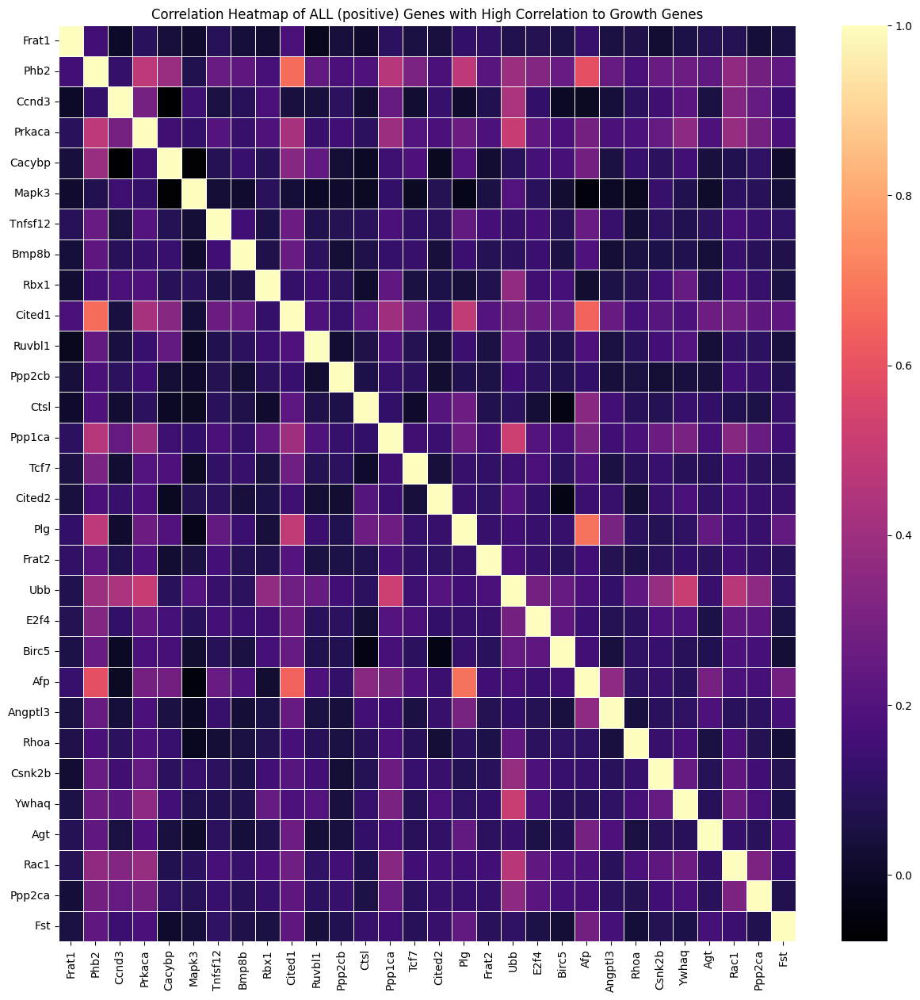

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

# Define the lists of genes and transcription factors
dan_positive_maturation_genes = ["Col18a1", "Dsp", "Ptprf", "Gpc6", "Wnk3", "Cdh1", "Epb41l5", "Hook1", "Myo1b", "Rnf165",
    "Nav2", "Crb3", "Enpp1", "Igsf9", "Gata4", "Lpin2", "Arg1", "Igfbp2", "Tshz2", "Tmprss2",
    "Lad1", "Gata6", "Nhsl1", "Fgfr2", "Smo", "Rcan1", "Efna2", "Palm3", "Cers4", "Sorbs2"]

dan_positive_growth_genes = ["Phb2", "Cited1", "Afp", "Ubb", "Ppp1ca", "Prkaca", "Plg", "Rac1", "Ywhaq", "Csnk2b",
    "E2f4", "Cacybp", "Birc5", "Rbx1", "Ppp2ca", "Agt", "Angptl3", "Ruvbl1", "Tcf7", "Tnfsf12",
    "Fst", "Frat2", "Cited2", "Bmp8b", "Ccnd3", "Rhoa", "Ctsl", "Ppp2cb", "Frat1", "Mapk3"]

dan_TF = ["Sox17", "Nes", "Pax6", "Sox2", "Notch1", "Nr5a1", "Rfx4", "Sox9", "Hes1", "Smad1", "Sox4", "Sox18",
    "Klf7", "Sp8", "Pitx2", "Cdh1", "Klf4", "Ovol1", "Ocln", "Gsc", "Gata1", "Gata2", "Eomes", "Twist1",
    "Nkx2-5", "Mixl1", "Snai2", "Foxf1", "Hand1", "Foxc1", "Runx2", "Twist2", "Tbx6", "Snai1", "Ar", "Arid3c",
    "Atf5", "Atoh7", "Atoh8", "Bhlha15", "Cebpa", "Cebpd", "Creb3l3", "Cux2", "Dmrta1", "Elf3", "Esr1", "Fam170a",
    "Foxa1", "Foxa2", "Foxa3", "Foxq1", "Gata4", "Gata6", "Grhl1", "Hand2", "Hhex", "Hlf", "Hnf1a", "Hnf4a",
    "Hnf4g", "Irf6", "Klf15", "L3mbtl4", "Lbx2", "Lhx2", "Mlxipl", "Myrf", "Nfil3", "Nkx1-1", "Nr1h3", "Nr1h4",
    "Nr1i2", "Nr1i3", "Nr2f6", "Nr5a2", "Onecut1", "Onecut2", "Ppara", "Prox1", "Rbpjl", "Rora", "Rorc", "Sall1",
    "Six5", "Skor2", "Sox5", "Spic", "Srebf1", "Tbx15", "Tbx3", "Thap7", "Tigd2", "Tlx1", "Tshz2", "Xbp1", "Zfhx4",
    "Zfpm1", "Zglp1", "Zgpat", "Zkscan1"]

# Combine all three gene lists and remove duplicates
all_dan_genes = dan_positive_growth_genes + dan_positive_maturation_genes + dan_TF
all_dan_genes = list(set(all_dan_genes))

# Assuming data_cleaned is your cleaned dataframe
# Subset the dataframe to include only the genes of interest
subset_data = data_cleaned[all_dan_genes]

# Compute correlations for the subset
correlations_subset = subset_data.corr(numeric_only=True)

# Define a threshold for what you consider "high" correlation
threshold = 0.8

# Identify genes with high correlation to `dan_positive_growth_genes`
high_correlation_genes = []
for gene in dan_positive_growth_genes:
    high_corr = correlations_subset[gene][correlations_subset[gene].abs() > threshold].index.tolist()
    high_correlation_genes.extend(high_corr)

# Remove duplicates from the high correlation list
high_correlation_genes = list(set(high_correlation_genes))

# Create the subset of data with only the high correlation genes
selected_data = subset_data[high_correlation_genes]

# Check the first few rows of selected_data to ensure data looks correct
print(selected_data.head())

# If the data appears correct, plot the heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(selected_data.corr(), cmap='magma', annot=False, linewidths=.5)
plt.title('Correlation Heatmap of ALL (positive) Genes with High Correlation to Growth Genes', fontsize=12)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.show()


In [17]:
missing_genes_from_dataset = [gene for gene in dan_positive_maturation_genes if gene not in data_cleaned.columns]

print("Genes from the 'dan_positive_maturation_genes' list that are missing from the dataset:")
for gene in missing_genes_from_dataset:
    print(gene)


Genes from the 'dan_positive_maturation_genes' list that are missing from the dataset:


In [18]:
missing_genes_maturation = [gene for gene in dan_positive_maturation_genes if gene not in data_cleaned.columns]
print("Missing Genes from 'dan_positive_maturation_genes' in the dataset:", missing_genes_maturation)


Missing Genes from 'dan_positive_maturation_genes' in the dataset: []


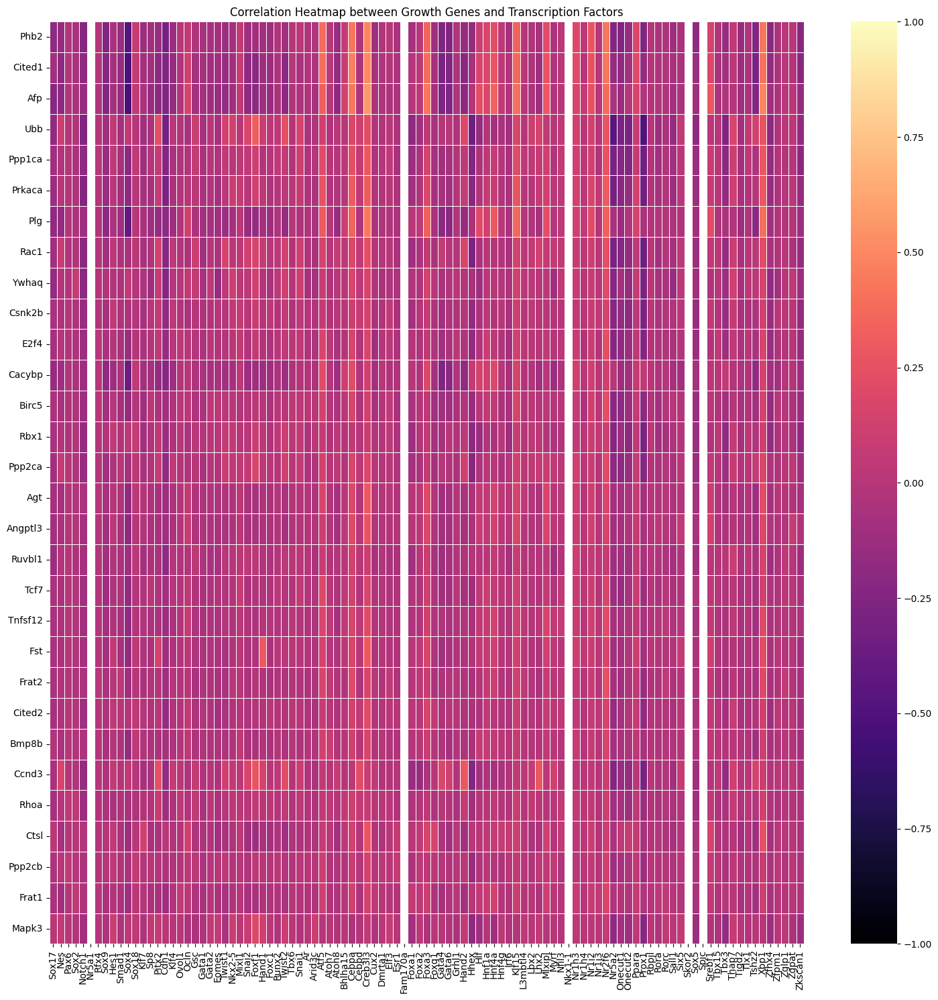

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define the lists of growth genes and transcription factors
dan_positive_growth_genes = [
    "Phb2", "Cited1", "Afp", "Ubb", "Ppp1ca", "Prkaca", "Plg", "Rac1", "Ywhaq", "Csnk2b",
    "E2f4", "Cacybp", "Birc5", "Rbx1", "Ppp2ca", "Agt", "Angptl3", "Ruvbl1", "Tcf7", "Tnfsf12",
    "Fst", "Frat2", "Cited2", "Bmp8b", "Ccnd3", "Rhoa", "Ctsl", "Ppp2cb", "Frat1", "Mapk3"
]

dan_TF = [
    "Sox17", "Nes", "Pax6", "Sox2", "Notch1", "Nr5a1", "Rfx4", "Sox9", "Hes1", "Smad1", "Sox4", "Sox18",
    "Klf7", "Sp8", "Pitx2", "Cdh1", "Klf4", "Ovol1", "Ocln", "Gsc", "Gata1", "Gata2", "Eomes", "Twist1",
    "Nkx2-5", "Mixl1", "Snai2", "Foxf1", "Hand1", "Foxc1", "Runx2", "Twist2", "Tbx6", "Snai1", "Ar", "Arid3c",
    "Atf5", "Atoh7", "Atoh8", "Bhlha15", "Cebpa", "Cebpd", "Creb3l3", "Cux2", "Dmrta1", "Elf3", "Esr1", "Fam170a",
    "Foxa1", "Foxa2", "Foxa3", "Foxq1", "Gata4", "Gata6", "Grhl1", "Hand2", "Hhex", "Hlf", "Hnf1a", "Hnf4a",
    "Hnf4g", "Irf6", "Klf15", "L3mbtl4", "Lbx2", "Lhx2", "Mlxipl", "Myrf", "Nfil3", "Nkx1-1", "Nr1h3", "Nr1h4",
    "Nr1i2", "Nr1i3", "Nr2f6", "Nr5a2", "Onecut1", "Onecut2", "Ppara", "Prox1", "Rbpjl", "Rora", "Rorc", "Sall1",
    "Six5", "Skor2", "Sox5", "Spic", "Srebf1", "Tbx15", "Tbx3", "Thap7", "Tigd2", "Tlx1", "Tshz2", "Xbp1", "Zfhx4",
    "Zfpm1", "Zglp1", "Zgpat", "Zkscan1"
]

# Combine both gene lists and remove duplicates
all_dan_genes = dan_positive_growth_genes + dan_TF
all_dan_genes = list(set(all_dan_genes))

# Assuming data_cleaned is your cleaned dataframe
# Subset the dataframe to include only the genes of interest
subset_data = data_cleaned[all_dan_genes]

# Compute correlations for the subset
correlations_subset = subset_data.corr(numeric_only=True)

# Extract the subset of correlations between growth genes and transcription factors
correlations_growth_vs_TF = correlations_subset.loc[dan_positive_growth_genes, dan_TF]

# Define a threshold for what you consider "significant" correlation
threshold = 0.8

# Identify growth genes with significant correlation to any transcription factor
significant_correlations = {}
for gene in dan_positive_growth_genes:
    significant_TFs = correlations_growth_vs_TF.loc[gene][correlations_growth_vs_TF.loc[gene].abs() > threshold].index.tolist()
    if significant_TFs:
        significant_correlations[gene] = significant_TFs

# Print the results
for gene, tf_list in significant_correlations.items():
    print(f"{gene} has significant correlation with: {', '.join(tf_list)}")

# If you'd like to visualize this, you can plot a heatmap for the subset of correlations
plt.figure(figsize=(15, 15))
sns.heatmap(correlations_growth_vs_TF, cmap='magma', annot=False, linewidths=.5, vmin=-1, vmax=1)
plt.title('Correlation Heatmap between Growth Genes and Transcription Factors', fontsize=12)

# Explicitly set x-tick labels for transcription factors and y-tick labels for growth genes
plt.xticks(ticks=np.arange(0.5, len(dan_TF)), labels=dan_TF, rotation=90, fontsize=10)
plt.yticks(ticks=np.arange(0.5, len(dan_positive_growth_genes)), labels=dan_positive_growth_genes, rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

Cdh1 has significant correlation with: Cdh1
Gata4 has significant correlation with: Gata4
Tshz2 has significant correlation with: Tshz2
Gata6 has significant correlation with: Gata6


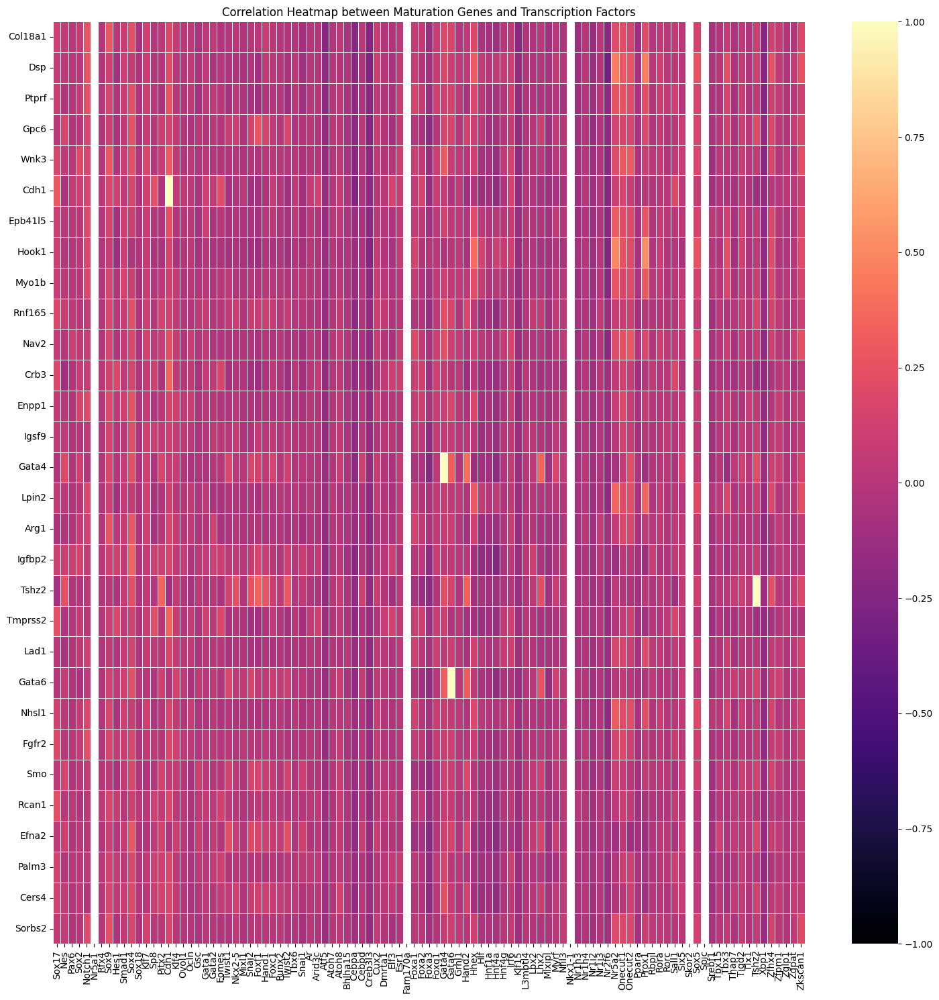

In [20]:
import numpy as np

# Assuming you've already defined dan_TF and imported necessary libraries

# Define the list of maturation genes (you'll need to fill this in)
dan_positive_maturation_genes = ["Col18a1", "Dsp", "Ptprf", "Gpc6", "Wnk3", "Cdh1", "Epb41l5", "Hook1", "Myo1b", "Rnf165",
    "Nav2", "Crb3", "Enpp1", "Igsf9", "Gata4", "Lpin2", "Arg1", "Igfbp2", "Tshz2", "Tmprss2",
    "Lad1", "Gata6", "Nhsl1", "Fgfr2", "Smo", "Rcan1", "Efna2", "Palm3", "Cers4", "Sorbs2"]  # positive maturation genes here

# Combine both gene lists and remove duplicates
all_dan_genes_maturation = dan_positive_maturation_genes + dan_TF
all_dan_genes_maturation = list(set(all_dan_genes_maturation))

# Subset the dataframe to include only the genes of interest
subset_data_maturation = data_cleaned[all_dan_genes_maturation]

# Compute correlations for the subset
correlations_subset_maturation = subset_data_maturation.corr(numeric_only=True)

# Extract the subset of correlations between maturation genes and transcription factors
correlations_maturation_vs_TF = correlations_subset_maturation.loc[dan_positive_maturation_genes, dan_TF]

# Define a threshold for what you consider "significant" correlation
threshold = 0.8

# Identify maturation genes with significant correlation to any transcription factor
significant_correlations_maturation = {}
for gene in dan_positive_maturation_genes:
    significant_TFs = correlations_maturation_vs_TF.loc[gene][correlations_maturation_vs_TF.loc[gene].abs() > threshold].index.tolist()
    if significant_TFs:
        significant_correlations_maturation[gene] = significant_TFs

# Print the results
for gene, tf_list in significant_correlations_maturation.items():
    print(f"{gene} has significant correlation with: {', '.join(tf_list)}")

# Visualize using a heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(correlations_maturation_vs_TF, cmap='magma', annot=False, linewidths=.5, vmin=-1, vmax=1)
plt.title('Correlation Heatmap between Maturation Genes and Transcription Factors', fontsize=12)

# Explicitly set x-tick labels for transcription factors and y-tick labels for maturation genes
plt.xticks(ticks=np.arange(0.5, len(dan_TF)), labels=dan_TF, rotation=90, fontsize=10)
plt.yticks(ticks=np.arange(0.5, len(dan_positive_maturation_genes)), labels=dan_positive_maturation_genes, rotation=0, fontsize=10)

plt.tight_layout()
plt.show()


## Obviously there are more maturation genes that correlate with TF's than the growth genes- is that what you'd expect?? Please push back and criticize, it's the only way to move forward.

## Further Analysis: Spearman and Kendall Tau Correlations

To delve deeper into the relationship between the gene sets and transcription factors, we'll use two non-parametric correlation methods: **Spearman's rank correlation** and **Kendall's Tau**. Both methods assess monotonic relationships, whether linear or not, and are particularly useful when the data doesn't meet the normality assumption or when dealing with ordinal data.

### Why Spearman and Kendall Tau?
- **Spearman's rank correlation**: It captures the monotonic relationship between two variables without assuming that the relationship is linear. It's based on the ranked values for each variable rather than the raw data.

- **Kendall's Tau**: It is another non-parametric test that measures the strength and direction of association between two variables. It's less commonly used than Spearman but can be more accurate when there are small datasets or tied ranks.

### Our Approach:
1. For each gene in the `dan_positive_maturation_genes` and `dan_positive_growth_genes`, calculate its Spearman and Kendall Tau correlation with each transcription factor in the `dan_TF` list.
2. Visualize the distribution of correlation coefficients to understand the strength and direction of relationships.
3. Highlight genes and transcription factors with the highest correlations for potential further investigation.

This approach will help us identify specific genes and transcription factors that show strong monotonic relationships, guiding further investigation into their biological significance and potential roles in cell growth and maturation.


## Spearman Correlation Analysis between Genes and Transcription Factors

To understand the relationship between `dan_positive_maturation_genes`, `dan_positive_growth_genes` and the transcription factors (`dan_TF`), we'll employ the Spearman rank correlation. Spearman's correlation is a non-parametric measure of rank correlation (statistical dependence between the rankings of two variables). This method is chosen over Pearson as it does not assume a linear relationship and only requires that the data is ordinal.

Let's visualize these correlations using heatmaps.


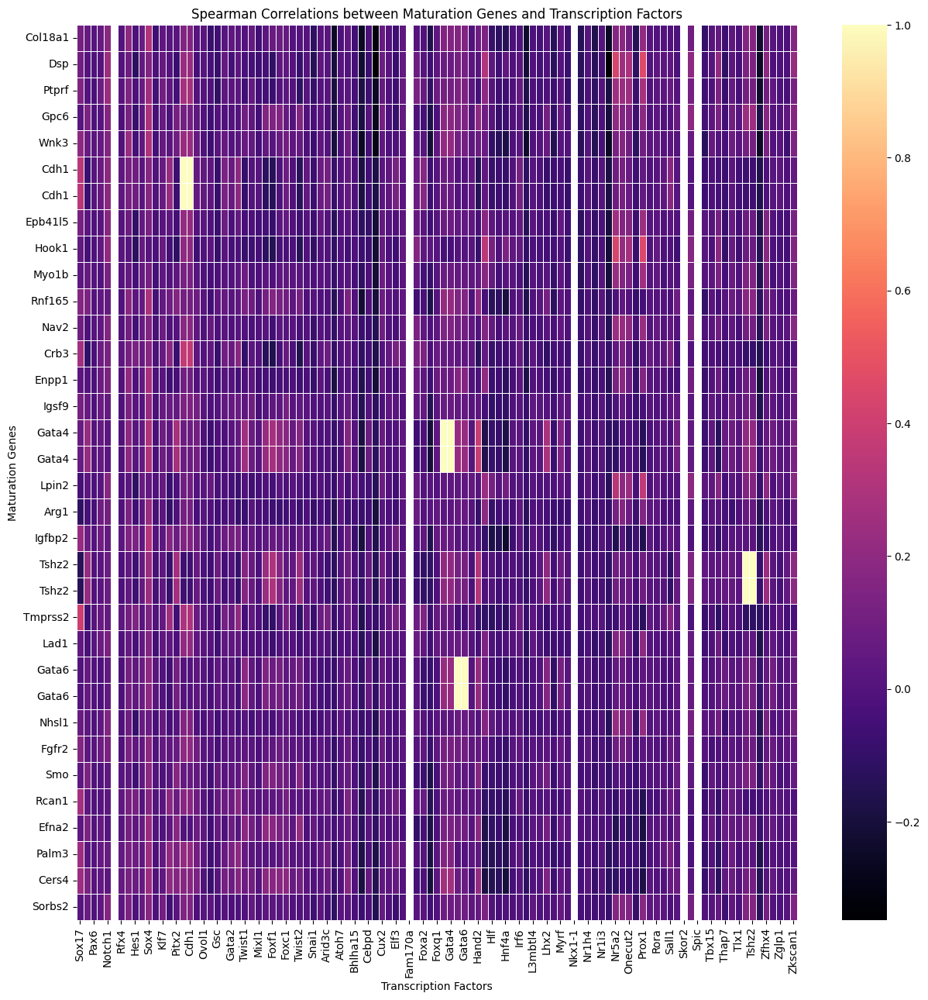

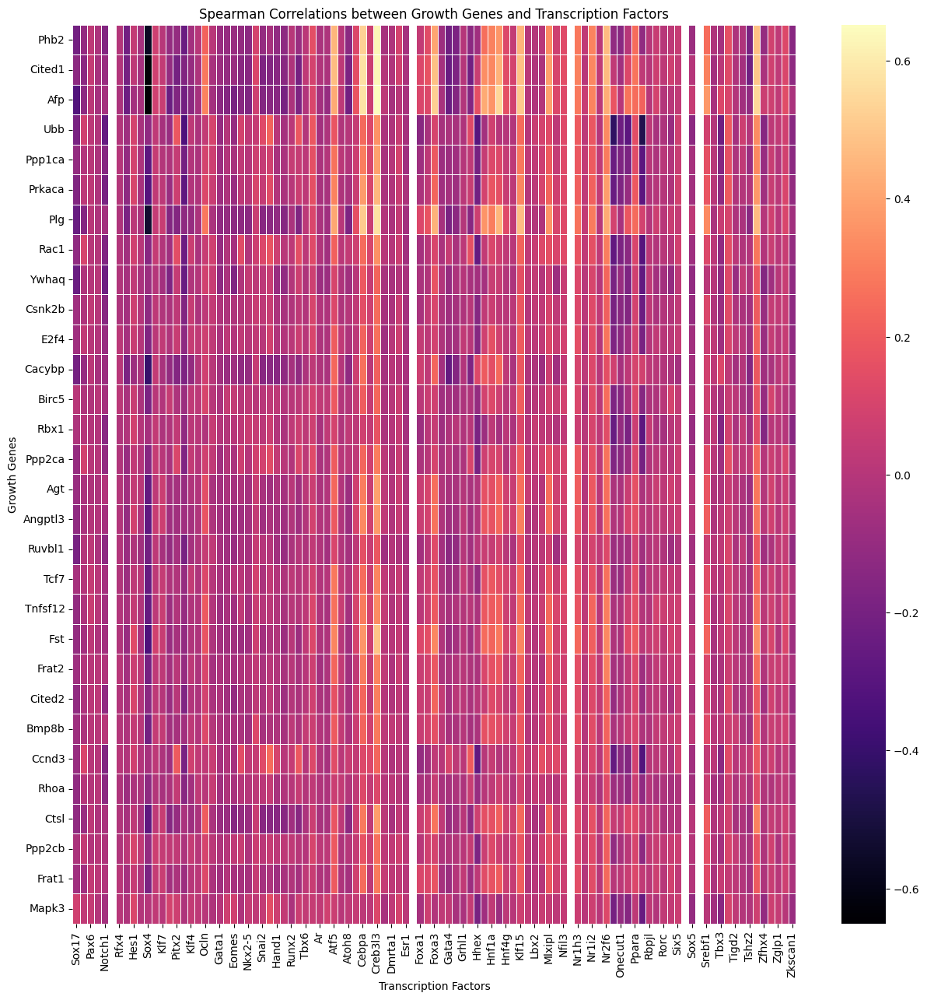

In [21]:
# Filtering the dataset for valid genes and transcription factors
valid_genes_maturation = [gene for gene in dan_positive_maturation_genes if gene in data_cleaned.columns]
valid_genes_growth = [gene for gene in dan_positive_growth_genes if gene in data_cleaned.columns]
valid_TFs = [tf for tf in dan_TF if tf in data_cleaned.columns]

correlation_data_maturation = data_cleaned[valid_genes_maturation + valid_TFs]
correlation_data_growth = data_cleaned[valid_genes_growth + valid_TFs]

# Compute Spearman correlations specifically between dan_positive_maturation_genes and valid_TFs
correlations_maturation_TF_spearman = correlation_data_maturation.corr(method='spearman').loc[valid_genes_maturation, valid_TFs]

# Visualize the heatmap for maturation genes
plt.figure(figsize=(15, 15))
sns.heatmap(correlations_maturation_TF_spearman, annot=False, cmap='magma', linewidths=.5)
plt.title('Spearman Correlations between Maturation Genes and Transcription Factors')
plt.xlabel('Transcription Factors')
plt.ylabel('Maturation Genes')
plt.show()

# Compute Spearman correlations specifically between valid_genes_growth and valid_TFs
correlations_growth_TF_spearman = correlation_data_growth.corr(method='spearman').loc[valid_genes_growth, valid_TFs]

# Visualize the heatmap for growth genes
plt.figure(figsize=(15, 15))
sns.heatmap(correlations_growth_TF_spearman, annot=False, cmap='magma', linewidths=.5)
plt.title('Spearman Correlations between Growth Genes and Transcription Factors')
plt.xlabel('Transcription Factors')
plt.ylabel('Growth Genes')
plt.show()



## Kendall Tau Correlation Analysis between Genes and Transcription Factors

The Kendall Tau rank correlation is a statistic used to measure the ordinal association between two measured quantities. It helps to identify the strength of dependence between two datasets. Given the nature of our data, the Kendall Tau correlation can offer a more robust measure compared to Spearman, especially when handling ties in the data.

Let's explore this relationship with heatmaps.


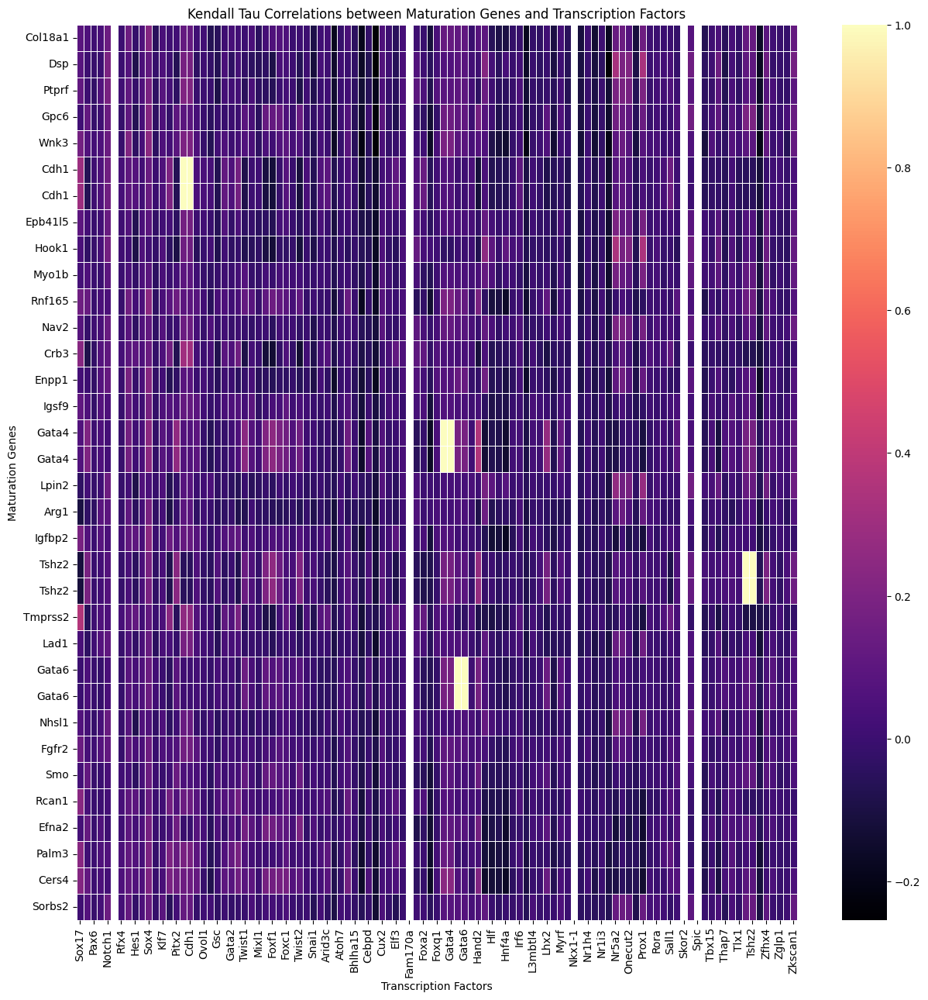

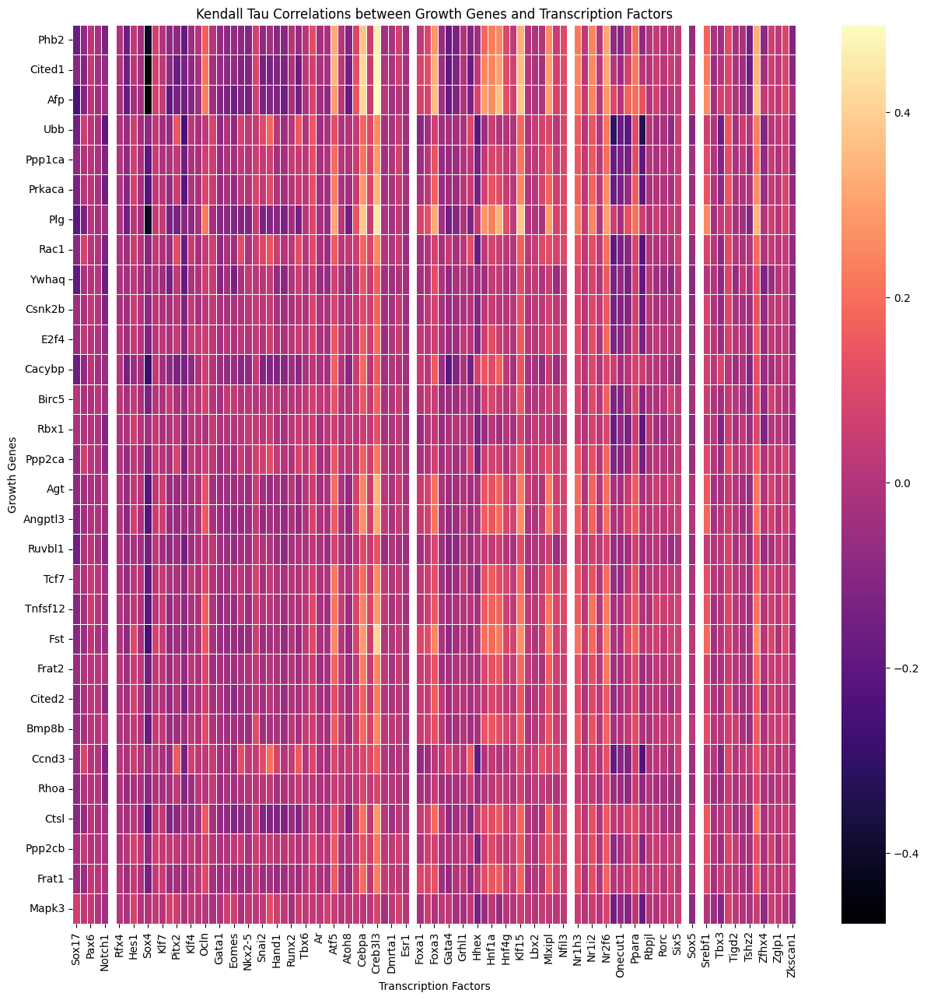

In [22]:
# Filtering the dataset for valid genes and transcription factors
valid_genes_maturation = [gene for gene in dan_positive_maturation_genes if gene in data_cleaned.columns]
valid_genes_growth = [gene for gene in dan_positive_growth_genes if gene in data_cleaned.columns]
valid_TFs = [tf for tf in dan_TF if tf in data_cleaned.columns]

correlation_data_maturation = data_cleaned[valid_genes_maturation + valid_TFs]
correlation_data_growth = data_cleaned[valid_genes_growth + valid_TFs]

# Compute Kendall Tau correlations specifically between dan_positive_maturation_genes and valid_TFs
correlations_maturation_TF_kendall = correlation_data_maturation.corr(method='kendall').loc[valid_genes_maturation, valid_TFs]

# Visualize the heatmap for maturation genes
plt.figure(figsize=(15, 15))
sns.heatmap(correlations_maturation_TF_kendall, annot=False, cmap='magma', linewidths=.5)
plt.title('Kendall Tau Correlations between Maturation Genes and Transcription Factors')
plt.xlabel('Transcription Factors')
plt.ylabel('Maturation Genes')
plt.show()

# Compute Kendall Tau correlations specifically between valid_genes_growth and valid_TFs
correlations_growth_TF_kendall = correlation_data_growth.corr(method='kendall').loc[valid_genes_growth, valid_TFs]

# Visualize the heatmap for growth genes
plt.figure(figsize=(15, 15))
sns.heatmap(correlations_growth_TF_kendall, annot=False, cmap='magma', linewidths=.5)
plt.title('Kendall Tau Correlations between Growth Genes and Transcription Factors')
plt.xlabel('Transcription Factors')
plt.ylabel('Growth Genes')
plt.show()


## Scatter Plots for Highly Correlated Gene and TF Pairs

To visually inspect the relationships found in the correlation analysis, scatter plots can be prettty fucking insightful. They allow us to see how each individual data point contributes to the correlation, helping identify potential outliers or specific patterns in the data.


<ipython-input-23-59d63f8585d6>:11: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for (gene, tf), correlation in top_correlations_maturation.iteritems():


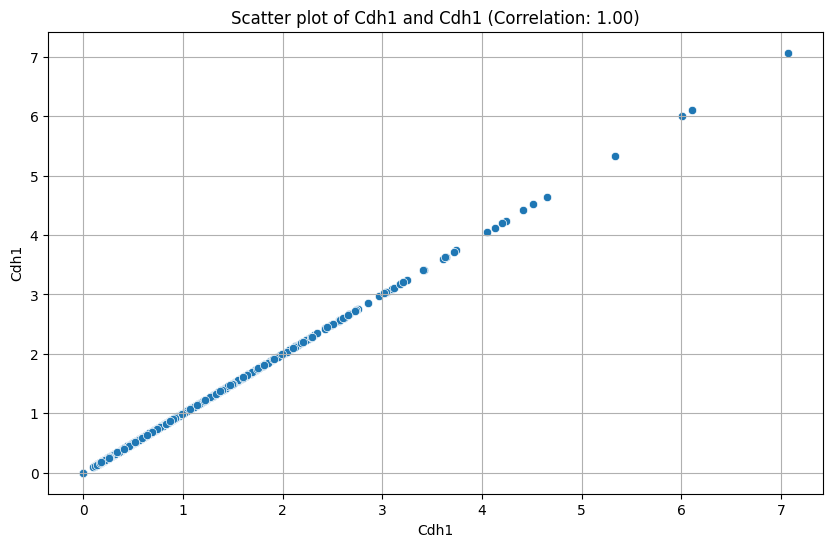

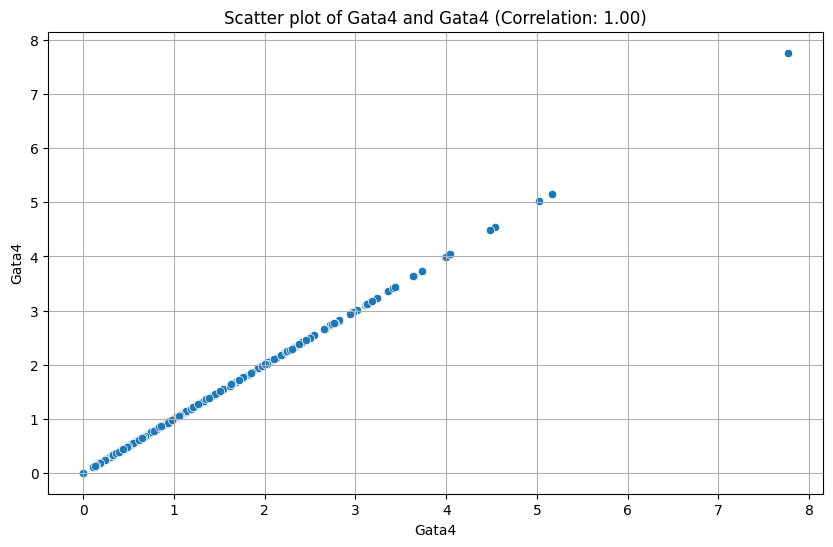

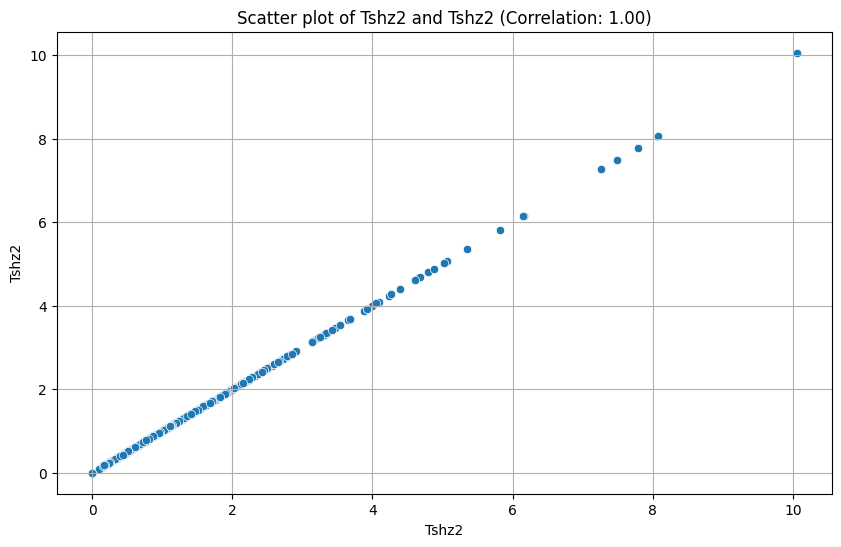

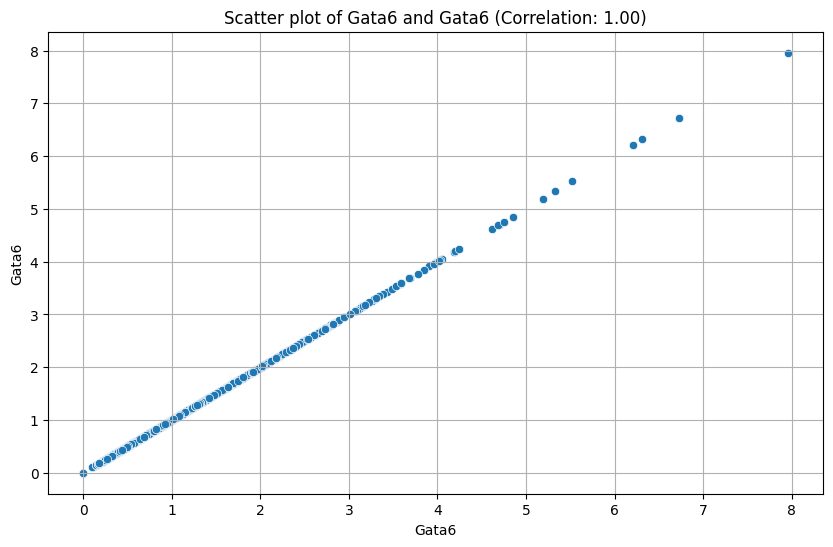

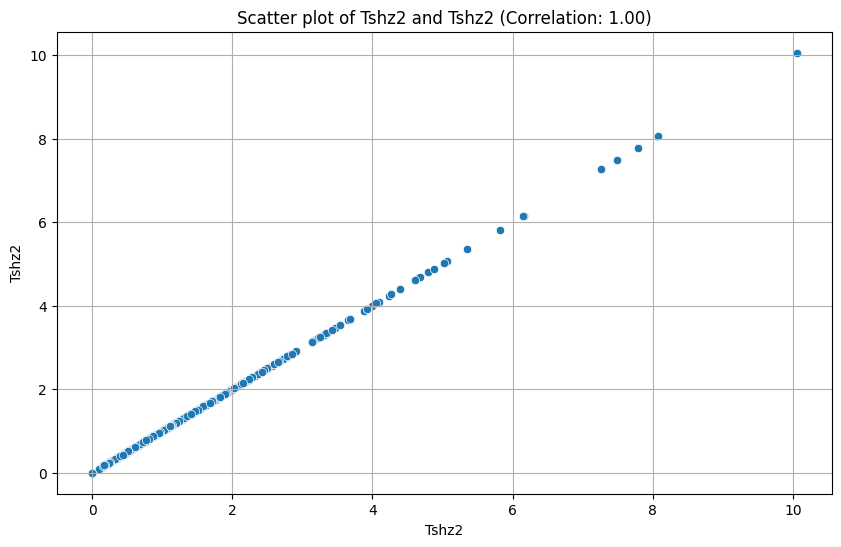

<ipython-input-23-59d63f8585d6>:20: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for (gene, tf), correlation in top_correlations_growth.iteritems():


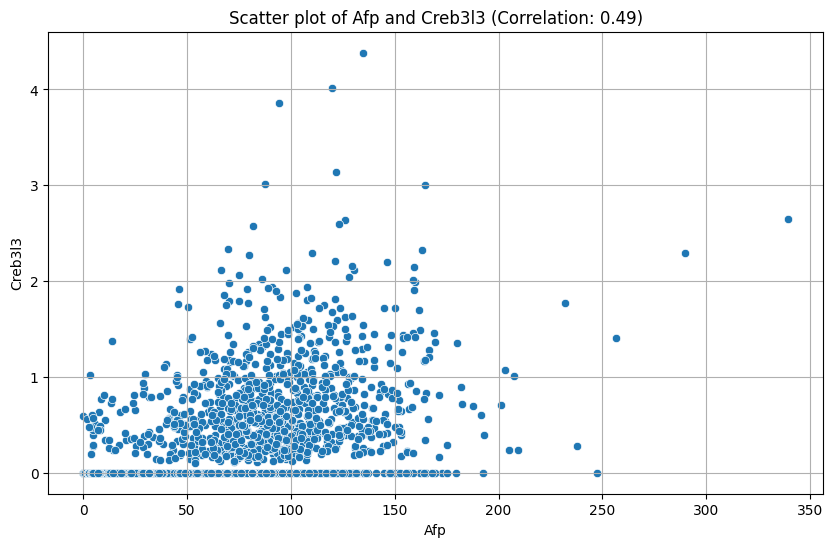

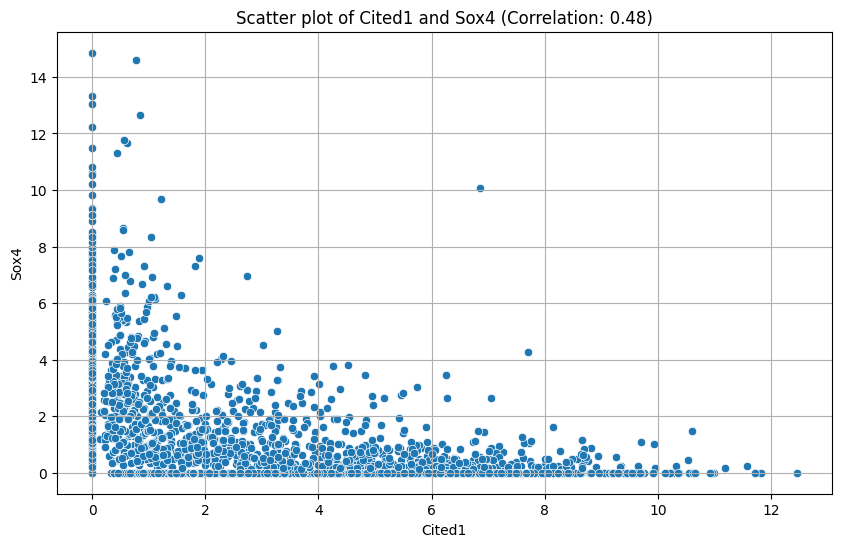

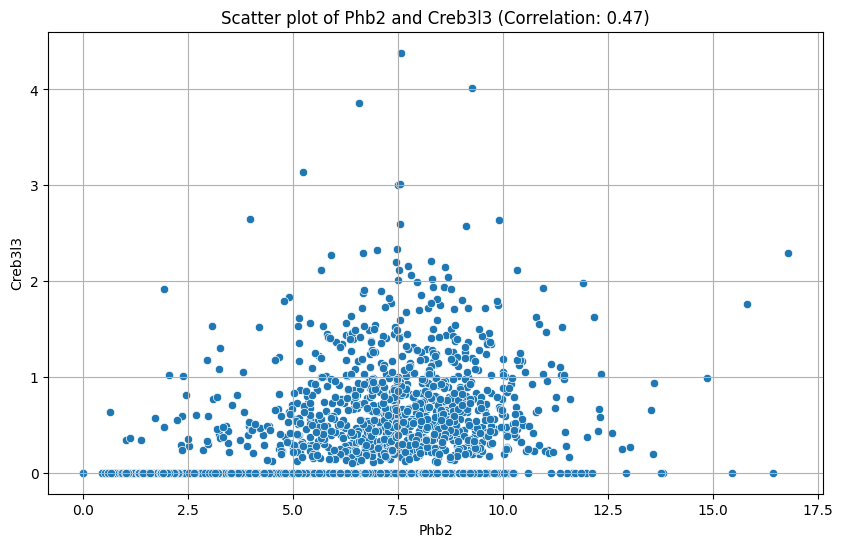

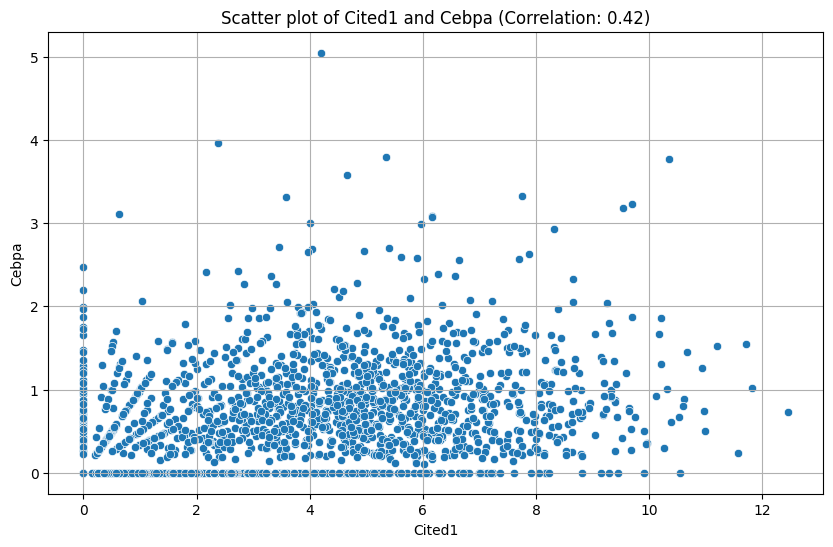

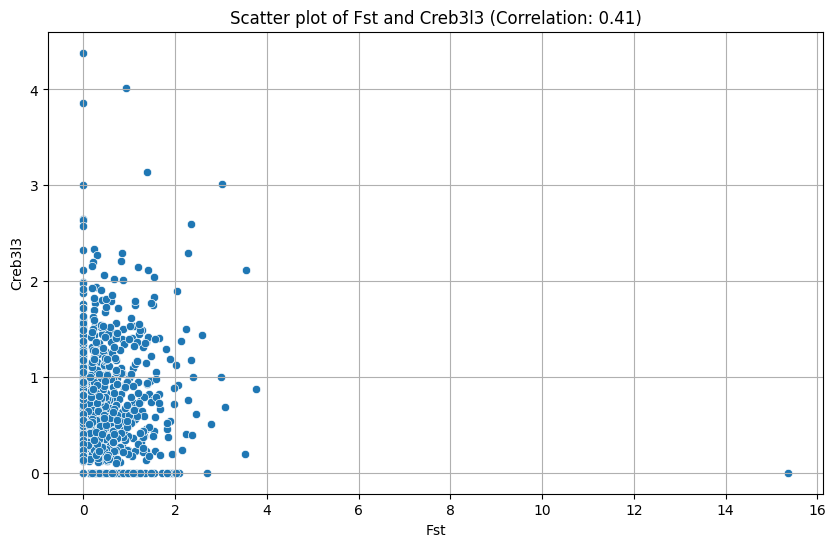

In [23]:
# Number of top correlations to visualize
num_top_correlations = 5

# Finding top correlated pairs for maturation genes
top_correlations_maturation = correlations_maturation_TF_kendall.abs().stack().nlargest(num_top_correlations*2)[::2]

# Finding top correlated pairs for growth genes
top_correlations_growth = correlations_growth_TF_kendall.abs().stack().nlargest(num_top_correlations*2)[::2]

# Create scatter plots for top correlated pairs
for (gene, tf), correlation in top_correlations_maturation.iteritems():
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=data_cleaned[gene], y=data_cleaned[tf])
    plt.title(f'Scatter plot of {gene} and {tf} (Correlation: {correlation:.2f})')
    plt.xlabel(gene)
    plt.ylabel(tf)
    plt.grid(True)
    plt.show()

for (gene, tf), correlation in top_correlations_growth.iteritems():
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=data_cleaned[gene], y=data_cleaned[tf])
    plt.title(f'Scatter plot of {gene} and {tf} (Correlation: {correlation:.2f})')
    plt.xlabel(gene)
    plt.ylabel(tf)
    plt.grid(True)
    plt.show()


*These scatter plots will give you a direct visual representation of how the expression levels of the genes and TFs vary with each other. Keep in mind that a scatter plot might show a clear relationship even if the correlation value isn't extremely high. Visual inspection can sometimes reveal nuances that statistical measures might miss.*

**Sorry for the linear graphs as they just are part of the package and I don't know how to shut them out of the input.**

---
## **Hypothesis 1: Maturation Gene List Analysis**

---

### **Objective**

The aim of this analysis is to delve into the relationship between maturation genes and two key markers: ALB and AFP, specifically at the E10.5 time point.

---

### **Steps to Address the Hypothesis**

1. **Filtering for Maturation Genes**:
   - Begin by selecting genes that fall within our predefined maturation gene list.
   
2. **Correlation Analysis**:
   - Compute the correlation of these maturation genes with ALB and AFP. This will help us to ascertain any potential relationships or trends between maturation and these two markers.

3. **Time Point Analysis (E10.5)**:
   - Focus on data corresponding to the E10.5 time point (cell_state starting with E105).
   - Identify genes from the maturation list that are most upregulated during this phase.

---

### **Expected Outcomes**

By the end of this analysis, we anticipate:
- A clear understanding of the relationship between maturation genes and the markers ALB and AFP.
- Identification of key maturation genes that are prominently upregulated at the E10.5 time point.

---


In [24]:
dan_positive_maturation_genes = ["Col18a1", "Dsp", "Ptprf", "Gpc6", "Wnk3", "Cdh1", "Epb41l5", "Hook1", "Myo1b", "Rnf165",
    "Nav2", "Crb3", "Enpp1", "Igsf9", "Gata4", "Lpin2", "Arg1", "Igfbp2", "Tshz2", "Tmprss2",
    "Lad1", "Gata6", "Nhsl1", "Fgfr2", "Smo", "Rcan1", "Efna2", "Palm3", "Cers4", "Sorbs2"]


In [25]:
maturation_data = data_cleaned[dan_positive_maturation_genes]


In [26]:
# Step 1: Filter for genes within the maturation gene list.
# Add "Alb" to your maturation gene list for the subset
maturation_genes_with_alb = dan_positive_maturation_genes + ["Alb"]
maturation_subset = data_cleaned[maturation_genes_with_alb]

# Step 2: Analyze the correlation of these genes with 'Alb'
correlations_with_alb = maturation_subset.corr()["Alb"]

# Display the correlations
print(correlations_with_alb)

# Step 3: Identify genes that are most upregulated for time point E10.5
# Using 'time_point' column for filtering data
e105_data = data_cleaned[data_cleaned['time_point'] == 'E105']

# Find the most upregulated genes.
# Here, we'll consider the mean expression level across all entries for E10.5.
# The higher the mean, the more "upregulated" the gene is.
most_upregulated_genes = e105_data.mean().nlargest(10)

# Display the most upregulated genes
print(most_upregulated_genes)


Col18a1   -0.248147
Dsp       -0.270661
Ptprf     -0.223301
Gpc6      -0.227973
Wnk3      -0.203373
Cdh1      -0.180754
Epb41l5   -0.185981
Hook1     -0.210292
Myo1b     -0.193724
Rnf165    -0.189820
Nav2      -0.167526
Crb3      -0.167782
Enpp1     -0.169677
Igsf9     -0.164778
Gata4     -0.167803
Lpin2     -0.193951
Arg1      -0.142163
Igfbp2    -0.161853
Tshz2     -0.169712
Tmprss2   -0.157841
Lad1      -0.189741
Gata6     -0.173146
Nhsl1     -0.175743
Fgfr2     -0.137520
Smo       -0.198244
Rcan1     -0.174484
Efna2     -0.170788
Palm3     -0.145930
Cers4     -0.138230
Sorbs2    -0.142546
Alb        1.000000
Name: Alb, dtype: float64
Afp        77.932846
Rpl41      76.846015
Rpl13      59.002780
Ptma       54.434301
mt-Atp6    54.213106
Rps19      50.180260
Rplp0      48.004212
Apoa2      47.262434
Ppia       45.513447
Rpl32      44.756511
dtype: float64


<ipython-input-26-82c67442daad>:19: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  most_upregulated_genes = e105_data.mean().nlargest(10)


**1. Heatmap for Correlations with Alb**

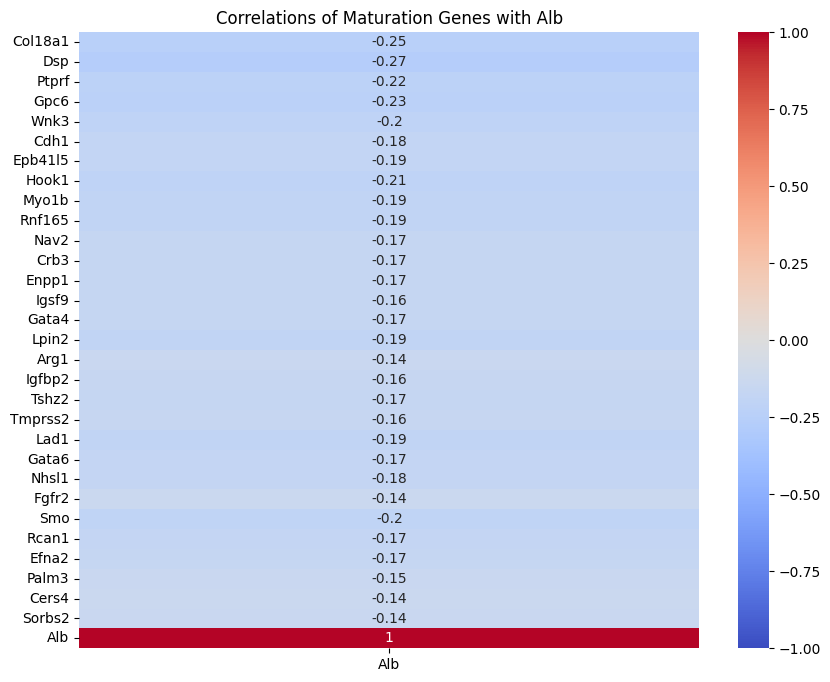

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

# Using Seaborn's heatmap function to visualize correlations
plt.figure(figsize=(10, 8))
sns.heatmap(correlations_with_alb.to_frame(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlations of Maturation Genes with Alb')
plt.show()


**2. Bar Plot for Most Upregulated Genes at E10.5**

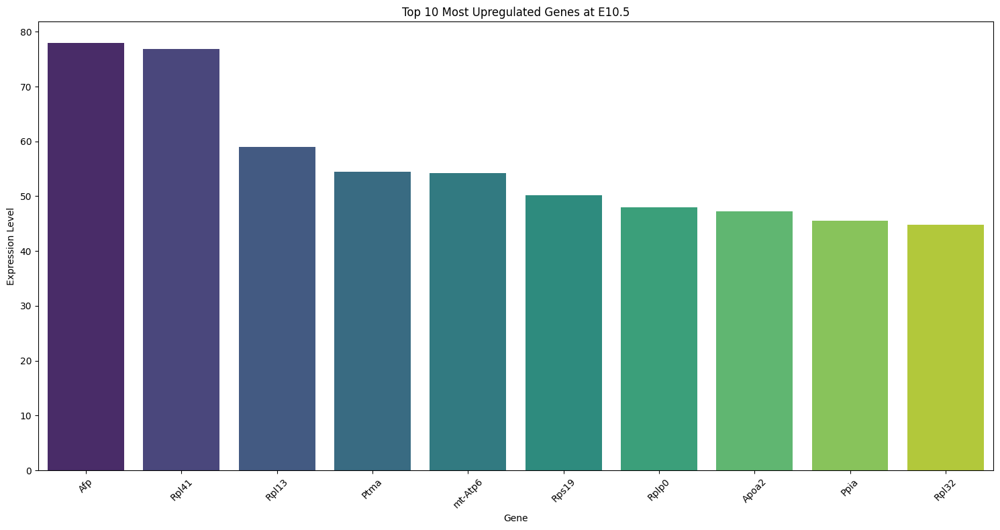

In [28]:
# Using Seaborn's barplot function
plt.figure(figsize=(15, 8))
sns.barplot(x=most_upregulated_genes.index, y=most_upregulated_genes.values, palette='viridis')
plt.title('Top 10 Most Upregulated Genes at E10.5')
plt.xlabel('Gene')
plt.ylabel('Expression Level')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Hypothesis 2: Growth Gene List Analysis at Early Stages

**Objective:**  
To investigate the expression patterns of genes within the growth gene list across early developmental stages and determine their correlation with the gene TBX3.

**Approach:**

1. **Data Filtering:**  
    - Filter the dataset to retain only genes within the growth gene list.
    - Further narrow down the dataset to include only the time points E8.5 (E85), E9.5 (E95), and E10.5 (E105).

2. **Gene Expression Analysis:**  
    - Visualize the expression levels of growth genes across the three time points using boxplots or violin plots. This will help identify any trends or shifts in expression as development progresses.

3. **Correlation with TBX3:**  
    - Calculate the correlation of each growth gene with TBX3 to identify any potential regulatory or cooperative relationships.
    - Visualize the correlations using a heatmap or bar plot for a clear representation of genes that might be closely tied with TBX3 function during these stages.

**Expected Outcome:**  
By the end of this analysis, we aim to understand the expression dynamics of growth genes during early developmental stages and identify any that might have a significant relationship with TBX3.


In [29]:
# Ensure cell_name exists in data_cleaned for the merge
if 'cell_name' not in data_cleaned.columns:
    data_cleaned['cell_state'] = data['cell_state']

# Merge time_point information into data_cleaned using cell_name as the key
data_cleaned = data_cleaned.merge(data[['cell_state', 'time_point']], on='cell_state', how='left')

# Now, proceed with the rest of the steps as previously outlined


<ipython-input-30-7f77eeaa429c>:16: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlations_with_tbx3 = growth_data.corr()['Tbx3'].drop('Tbx3')


Phb2      -0.174630
Cited1    -0.127263
Afp       -0.071738
Ubb       -0.300677
Ppp1ca    -0.223038
Prkaca    -0.202692
Plg       -0.089882
Rac1      -0.175865
Ywhaq     -0.189795
Csnk2b    -0.149447
E2f4      -0.124806
Cacybp     0.036815
Birc5     -0.077455
Rbx1      -0.179492
Ppp2ca    -0.131884
Agt       -0.091739
Angptl3   -0.057152
Ruvbl1    -0.015323
Tcf7      -0.037773
Tnfsf12   -0.063680
Fst       -0.062855
Frat2     -0.094477
Cited2    -0.107385
Bmp8b     -0.032963
Ccnd3     -0.190490
Rhoa      -0.075733
Ctsl      -0.079126
Ppp2cb    -0.066351
Frat1     -0.002248
Mapk3     -0.139021
Name: Tbx3, dtype: float64


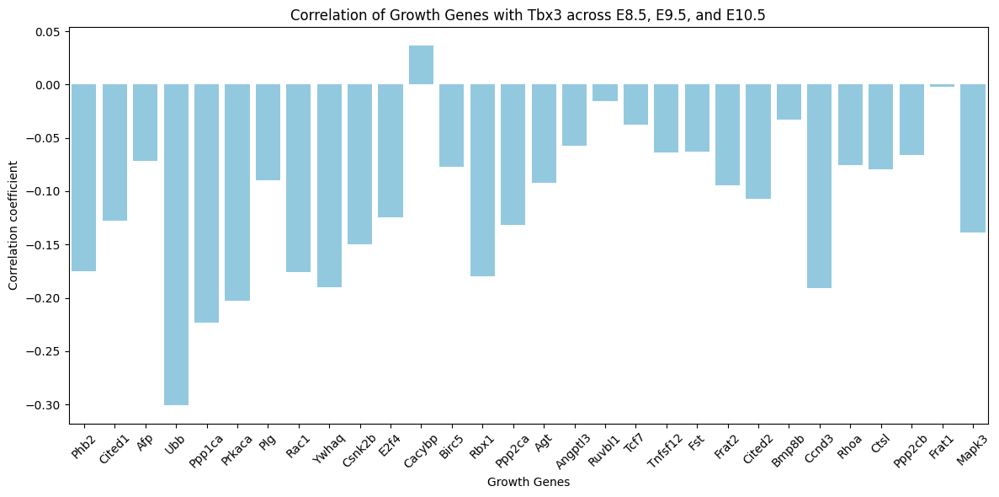

In [30]:
# Ensure cell_state exists in data_cleaned for the merge
if 'cell_state' not in data_cleaned.columns:
    data_cleaned['cell_state'] = data['cell_state']

# Merge time_point information into data_cleaned using cell_state as the key
data_cleaned = data_cleaned.merge(data[['cell_state', 'time_point']], on='cell_state', how='left')

# Filter for valid growth genes
valid_genes_growth = [gene for gene in dan_positive_growth_genes if gene in data_cleaned.columns]

# Extract the required data subset
data_subset = data_cleaned[data_cleaned['time_point'].isin(['E85', 'E95', 'E105'])]
growth_data = data_subset[valid_genes_growth + ['Tbx3', 'time_point']]

# Compute correlations between growth genes and Tbx3
correlations_with_tbx3 = growth_data.corr()['Tbx3'].drop('Tbx3')

# Display results
print(correlations_with_tbx3)

# Visualizing correlations using Seaborn
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.barplot(x=correlations_with_tbx3.index, y=correlations_with_tbx3.values, color='skyblue')
plt.title('Correlation of Growth Genes with Tbx3 across E8.5, E9.5, and E10.5')
plt.ylabel('Correlation coefficient')
plt.xlabel('Growth Genes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Hypothesis 3: Noise Reduction in Data

**Objective:** Employ dimensionality reduction techniques to aggregate high-dimensional gene expression data and visualize the reduced data for cell-to-cell comparisons.

### Plan of Action:

1. **PCA (Principal Component Analysis)**
   * **What is it?** A linear technique to identify directions in which data varies the most.
   * **Action Plan**:
     * Use PCA to reduce data into two primary components (PC1 and PC2).
     * Visualize the results to identify any clear groupings or separations.

2. **t-SNE (t-distributed Stochastic Neighbor Embedding)**
   * **What is it?** A nonlinear technique that's effective for visualizing high-dimensional datasets.
   * **Action Plan**:
     * Apply t-SNE on the data to transform it into a 2D space.
     * Visualize the transformed data to observe any natural groupings.

3. **Visualization**
   * Use `seaborn` and `matplotlib` libraries to create visual plots of the reduced data.
   * Observe if there are any clear distinctions or groupings which may represent different maturity and growth stages.


### t-SNE Analysis on Maturation Gene Sets

#### What is t-SNE?

t-Distributed Stochastic Neighbor Embedding (t-SNE) is a machine learning algorithm specifically designed for the visualization of high-dimensional datasets. It is a non-linear dimensionality reduction technique that can be particularly useful for visualizing data clusters on a 2D or 3D plane. The algorithm works by calculating the probability that pairs of data points in the high-dimensional space are related and then chooses a low-dimensional representation that produces a similar distribution.

#### Objective:

In the context of our dataset, we aim to:

- Utilize t-SNE to reduce the dimensionality of our data, specifically focusing on the positive and negative maturation gene sets.
- Visualize the data in a 2D plane to examine potential clusters or groupings.
- Interpret these clusters to understand if there's any inherent structure in the data pertaining to maturation.

By doing this, we hope to gain a better understanding of how genes from the maturation sets relate to one another and if they inherently cluster together based on their expression profiles across different cell states.


**maturation genes t_SNE analysis**

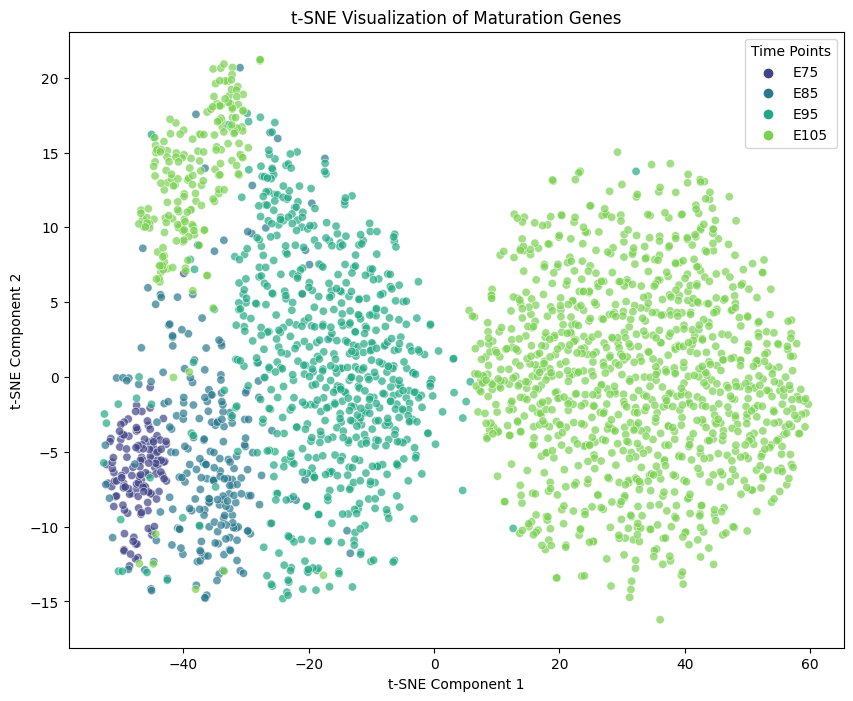

In [33]:
# Necessary Imports
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Filter data
maturation_data = data_cleaned[dan_maturation_genes]

# Step 2: Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(maturation_data)

# Step 3: Apply t-SNE transformation
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(scaled_data)

# Step 4: Visualize the 2D representation
plt.figure(figsize=(10, 8))
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=data_cleaned['time_point'], palette="viridis", alpha=0.7)
plt.title("t-SNE Visualization of Maturation Genes")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title='Time Points')
plt.show()


## t-SNE Analysis on Growth Genes

**Objective:** The t-distributed Stochastic Neighbor Embedding (t-SNE) technique is a powerful tool for visualizing high-dimensional data. By mapping high-dimensional data to a lower-dimensional space, t-SNE captures the similarity of datapoints in terms of their local relationships.

In this step, we aim to employ t-SNE to explore and visualize patterns among cells based on their expression of growth-related genes. We hope this will offer insights into cell-to-cell similarities based on growth potential.


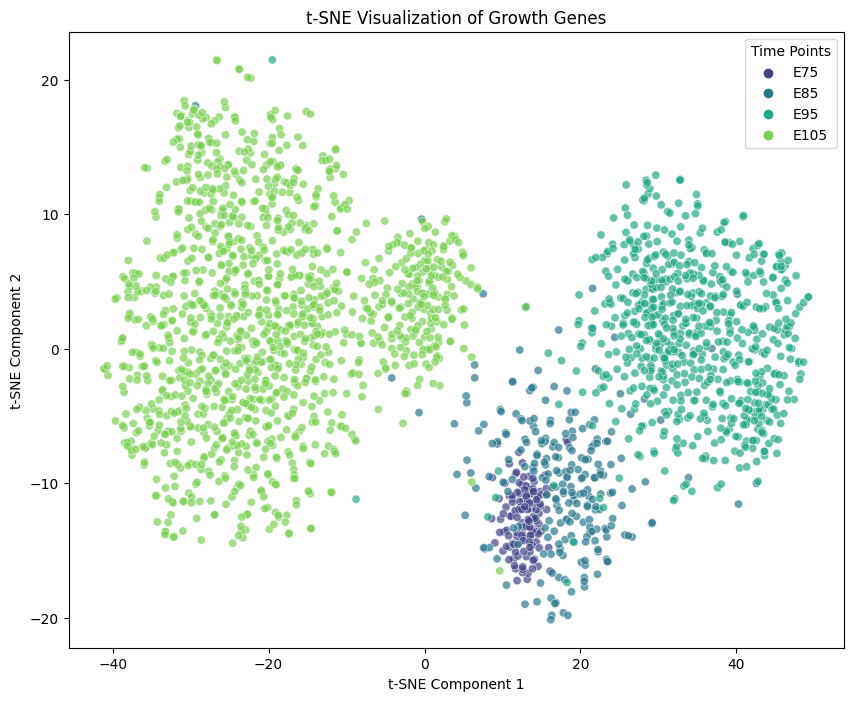

In [34]:
# Step 1: Extract the subset of data for growth genes
growth_data_subset = data_cleaned[dan_growth_genes]

# Step 2: Standardize the data
from sklearn.preprocessing import StandardScaler
scaled_growth_data = StandardScaler().fit_transform(growth_data_subset)

# Step 3: Perform t-SNE
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(scaled_growth_data)

# Step 4: Visualize the 2D representation
plt.figure(figsize=(10, 8))
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=data_cleaned['time_point'], palette="viridis", alpha=0.7)
plt.title("t-SNE Visualization of Growth Genes")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title='Time Points')
plt.show()


## Cluster Annotation on t-SNE Results

### Objective:
Annotate the clusters formed in the t-SNE visualization to provide meaningful insights into the structure of our dataset, particularly focusing on the predominance of time points within each cluster.

### Approach:
1. **Clustering with KMeans:**  
    - Given the continuous nature of the t-SNE results, we'll apply the KMeans clustering algorithm to group the cells into distinct clusters.
    - The number of clusters (often denoted as `k`) is a hyperparameter. One can choose `k` based on the visually distinguishable groups in the t-SNE plot or employ techniques like the elbow method.

2. **Determine the Predominant Time Point for Each Cluster:**  
    - Once clusters are formed, we'll identify the most frequent time point within each cluster. This will offer a perspective on the major time point that characterizes each cluster.
    
3. **Visualization with Annotations:**  
    - We'll plot the t-SNE results again, this time coloring the cells based on their cluster assignment.
    - Each cluster will be annotated with its predominant time point, giving a clear view of how cells from different time points group together in the t-SNE space.

### Expected Outcome:
A t-SNE plot where each cluster is distinctly colored and annotated, offering insights into the behavior of cells from different time points in the reduced t-SNE space.


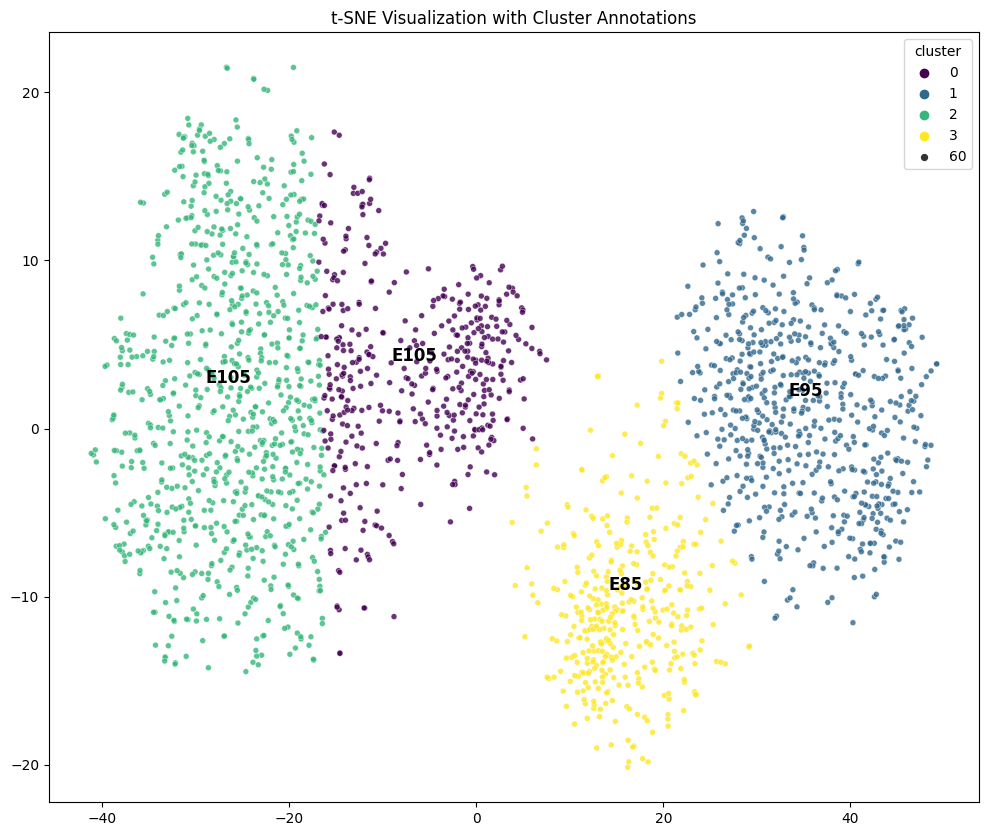

In [36]:
# Scatter plot for t-SNE results with clusters colored
plt.figure(figsize=(12, 10))
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=data_cleaned['cluster'], palette="viridis", size=60, alpha=0.8, legend="full")

# Annotate each cluster with its predominant time point
for cluster_num, time_point in cluster_timepoints.items():
    cluster_center = tsne_results[data_cleaned['cluster'] == cluster_num].mean(axis=0)
    plt.annotate(time_point, (cluster_center[0], cluster_center[1]), textcoords="offset points", xytext=(0,10), ha='center', fontsize=12, fontweight='bold')

plt.title("t-SNE Visualization with Cluster Annotations")
plt.show()



## **Comparing t-SNE Visualization with Known Data**

### **Objective:**
Our primary goal is to correlate our t-SNE visualizations with pre-existing biological knowledge. This process allows us to validate our results and understand their biological significance. If our t-SNE visualizations correctly represent the underlying data, cells from the same or similar time points should cluster together, reflecting expected cell states or types at those specific time points.

### **Approach:**
1. **Overlay Time Point Labels:** On our t-SNE visualization, we will overlay labels indicating the time points of each cell. This way, we can visually assess how cells from each time point are distributed across the plot.
  
2. **Assessment Criteria:** Our expectations, based on prior biological knowledge, are:
   - Cells from the same time points should predominantly cluster together.
   - Adjacent time points (e.g., E8.5 and E9.5) might exhibit some overlap or closely neighboring clusters, reflecting the continuous nature of development.

3. **Interpretation:** The proximity and overlap of cells in the t-SNE plot can give insights into the similarity of their gene expression profiles. For instance:
   - If cells from a particular time point are scattered across the plot, it suggests considerable heterogeneity in their gene expression.
   - Tight clusters of cells from a single time point would indicate a homogenous gene expression profile at that stage.

### **Importance:**
This exercise provides a reality check for our analysis. By comparing with what we already know, we ensure our techniques yield biologically relevant and interpretable insights. It also helps in identifying potential outliers or anomalies that might warrant further investigation.


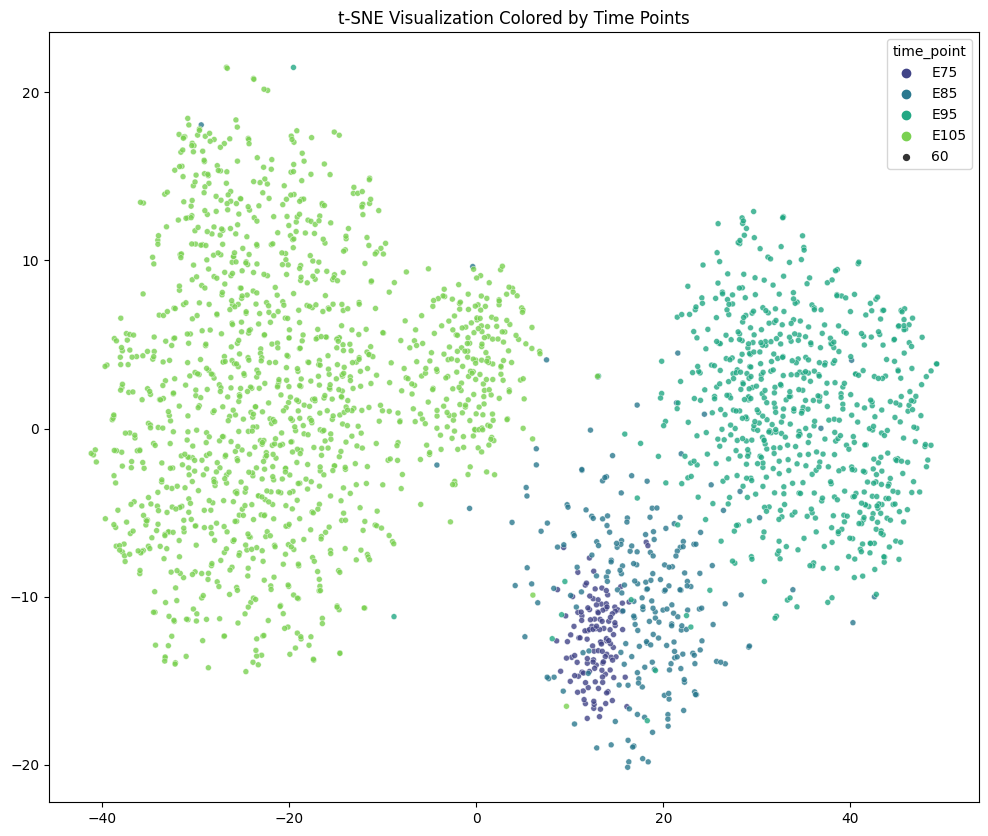

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot for t-SNE results colored by time points
plt.figure(figsize=(12, 10))
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=data_cleaned['time_point'], palette="viridis", size=60, alpha=0.8, legend="full")

plt.title("t-SNE Visualization Colored by Time Points")
plt.show()


## **Understanding the t-SNE Axes**

### **t-SNE Components:**
The axes of a t-SNE plot, often labeled as t-SNE Component 1 and t-SNE Component 2 (or simply X and Y), represent the two main dimensions resulting from the t-SNE dimensionality reduction. These axes do not have a direct biological or physical interpretation like some other types of axes might. Instead, their primary purpose is to display similarity between data points—in this case, cells.

### **Key Points:**
1. **Distance Matters:** In t-SNE plots, the distance between points (cells) is meaningful. Cells that are closer together have more similar gene expression profiles compared to cells that are farther apart.

2. **Absence of Scale:** The actual values on the t-SNE axes (e.g., the tick marks) do not hold specific biological significance. It's the relative positioning of the points that matters, not the exact coordinates.

3. **Orientation is Arbitrary:** The orientation of the plot (e.g., which clusters are on the left, right, top, or bottom) can vary between different runs of t-SNE, especially if the algorithm's random seed changes. The shape and clustering of the data, however, should remain consistent.

### **Interpretation:**
- **Clusters:** Groups or clusters of points on the plot indicate cells with similar gene expression patterns. The presence of distinct clusters can suggest distinct cell types or states.
  
- **Overlaps:** Areas where points from different conditions or time points overlap might suggest transitional states or shared expression patterns across those conditions.

### **Importance:**
While the axes themselves lack a direct interpretation, understanding the spatial relationships in t-SNE plots is crucial. Recognizing clusters and patterns in the plot can provide insights into the underlying structure of the data, revealing potential cell subpopulations, developmental trajectories, or differentiation pathways.


## **t-SNE Parameter Tuning**

**Objective:**  
Optimize the t-SNE parameters to achieve clearer and more interpretable visualizations of our dataset.

### **Steps:**

1. **Define the Parameter Grid:**  
   - **Perplexity:** We'll test values such as `[5, 10, 15, 20, 30, 40, 50]`.
   - **Learning Rate:** We'll test values such as `[10, 100, 500, 1000]`.

2. **Run t-SNE for Each Parameter Combination:**  
Iterate over each combination of perplexity and learning rate, run t-SNE, and visualize the results.

3. **Evaluate Results:**  
Based on the visual output, choose the parameter combination that:
   - Achieves distinct clustering.
   - Has minimal overlap between clusters.
   - Makes the most biological sense in the context of our data.

### **Expected Outcome:**  
After tuning, we should obtain a t-SNE visualization that better represents the underlying structure of our data and provides clearer insights into potential cell states or subpopulations.

### **Interpretation:**  
The optimal parameters might differ based on dataset characteristics and size. By observing patterns, overlaps, and distinct clusters, we can gain insights into cell similarities, differences, and potential developmental trajectories. Always validate findings using biological knowledge or other methodologies.


## Parameter Tuning for t-SNE Analysis

For any dimensionality reduction technique, especially t-SNE, parameter tuning can be vital. The structure in the data can be influenced by the choice of parameters. For t-SNE, two key parameters can influence the visualization:

- **Perplexity**: It can be thought of as a knob controlling the balance of attention between local and global aspects in the data. Typical values are between 5 and 50, though the ideal choice often depends on the dataset's density.
- **Learning Rate**: This affects how much the projections are adjusted at each iteration. Typical values range from 10 to 1000.

For this analysis, we'll explore multiple combinations of these parameters to ascertain which offers the clearest insight into our data structure. By visualizing the results of different parameter combinations, we can identify the one that provides the best separation and clustering of data points, reflecting underlying patterns in the data.

Let's proceed with the parameter tuning:

**dan_growth_genes**

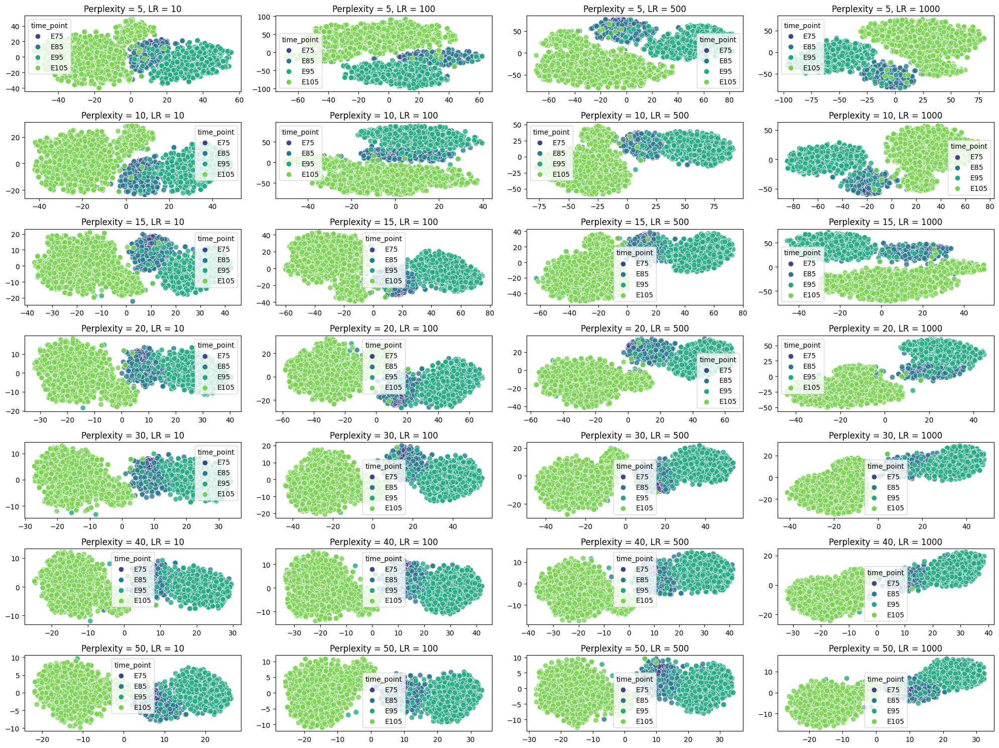

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Extract relevant gene data
data_subset = data_cleaned[dan_growth_genes]

# Standardize the data
scaled_data = StandardScaler().fit_transform(data_subset.dropna())

# Define parameter grid
perplexities = [5, 10, 15, 20, 30, 40, 50]
learning_rates = [10, 100, 500, 1000]

# Initialize a figure
plt.figure(figsize=(20, 15))

# Iterate over perplexity and learning rate values
for i, perplexity in enumerate(perplexities):
    for j, learning_rate in enumerate(learning_rates):
        # Run t-SNE with specific parameters
        tsne = TSNE(n_components=2, perplexity=perplexity, learning_rate=learning_rate, random_state=42)
        tsne_results = tsne.fit_transform(scaled_data)

        # Plot the results
        plt.subplot(len(perplexities), len(learning_rates), i*len(learning_rates) + j + 1)
        sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=data_cleaned['time_point'].iloc[:len(tsne_results)], palette="viridis", s=60, alpha=0.8).set_title(f'Perplexity = {perplexity}, LR = {learning_rate}')

# Adjust the layout and display the figure
plt.tight_layout()
plt.show()



## Parameter Tuning for t-SNE Analysis on Maturation Genes

As with the growth genes, it's crucial to tune the parameters when analyzing the maturation genes using t-SNE. Fine-tuning the parameters can help elucidate underlying patterns and relationships within the data, offering insight into the progression of cell maturation stages.

Here's how we'll proceed with the parameter tuning for the maturation genes:


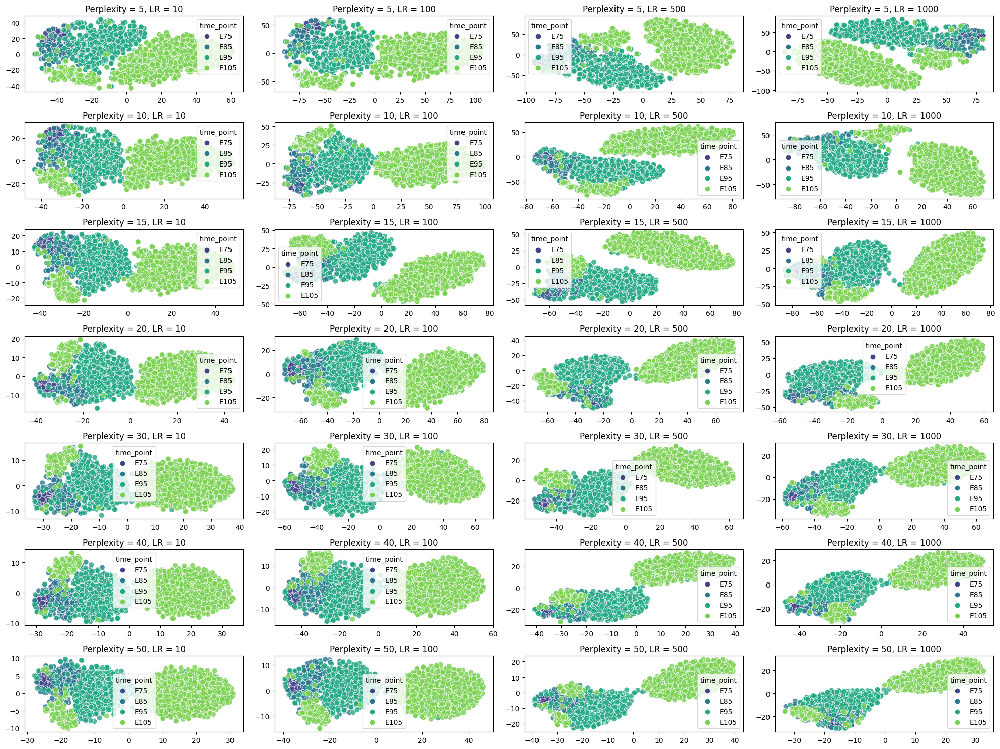

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Extract relevant gene data for maturation genes
data_subset_maturation = data_cleaned[dan_maturation_genes]

# Standardize the data
scaled_data_maturation = StandardScaler().fit_transform(data_subset_maturation.dropna())

# Define parameter grid
perplexities = [5, 10, 15, 20, 30, 40, 50]
learning_rates = [10, 100, 500, 1000]

# Initialize a figure
plt.figure(figsize=(20, 15))

# Iterate over perplexity and learning rate values
for i, perplexity in enumerate(perplexities):
    for j, learning_rate in enumerate(learning_rates):
        # Run t-SNE with specific parameters
        tsne = TSNE(n_components=2, perplexity=perplexity, learning_rate=learning_rate, random_state=42)
        tsne_results_maturation = tsne.fit_transform(scaled_data_maturation)

        # Plot the results
        plt.subplot(len(perplexities), len(learning_rates), i*len(learning_rates) + j + 1)
        sns.scatterplot(x=tsne_results_maturation[:, 0], y=tsne_results_maturation[:, 1], hue=data_cleaned['time_point'].iloc[:len(tsne_results_maturation)], palette="viridis", s=60, alpha=0.8).set_title(f'Perplexity = {perplexity}, LR = {learning_rate}')

# Adjust the layout and display the figure
plt.tight_layout()
plt.show()
